# Visualise global and spatial effects of best environmental predictors under different IMFs


### imports

In [1]:
import sys
import os

import numpy as np
import pandas as pd
import xarray as xr
import scipy as sci
import h5py as h5

import matplotlib.pyplot as plt
from matplotlib import ticker
from matplotlib.gridspec import GridSpec
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean.cm as cmo
from cmocean.tools import lighten

# regridding package
import xesmf as xe


# print versions of packages
print("python version =",sys.version[:5])
print("numpy version =", np.__version__)
print("pandas version =", pd.__version__)
print("xarray version =", xr.__version__)
print("scipy version =", sci.__version__)
print("h5py version =", h5.__version__)
print("matplotlib version =", sys.modules[plt.__package__].__version__)
print("cmocean version =", sys.modules[cmo.__package__].__version__)
print("cartopy version =", sys.modules[ccrs.__package__].__version__)
print("xesmf version =", xe.__version__)


wrkdir = "/g/data/es60/SEAPODYM/pearse_GAMs"
os.chdir(wrkdir)


python version = 3.10.
numpy version = 2.2.5
pandas version = 2.3.3
xarray version = 2025.4.0
scipy version = 1.15.3
h5py version = 3.15.1
matplotlib version = 3.10.6
cmocean version = v3.0.3
cartopy version = 0.24.1
xesmf version = 0.8.10


### Load dask cluster

In [2]:
from dask.distributed import Client, LocalCluster

# Rule of thumb here:
# - 56 workers × 1 thread each (good isolation for NumPy/xarray)
# - ~8 GB per worker → 56 * 8 = 448 GB (leaves headroom for OS, Jupyter, scheduler)
cluster = LocalCluster(
    n_workers=28,
    threads_per_worker=1,
    memory_limit="8GB",
    # Optional niceties:
    dashboard_address=":8787",   # or ":0" for random free port
    processes=True,
)

client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 28
Total threads: 28,Total memory: 208.62 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34729,Workers: 0
Dashboard: /proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:36605,Total threads: 1
Dashboard: /proxy/35593/status,Memory: 7.45 GiB
Nanny: tcp://127.0.0.1:36235,


2026-02-11 15:07:53,156 - tornado.application - ERROR - Uncaught exception GET /individual-workers-memory/ws (127.0.0.1)
HTTPServerRequest(protocol='http', host='gadi-cpu-bdw-0122.gadi.nci.org.au:24688', method='GET', uri='/individual-workers-memory/ws', version='HTTP/1.1', remote_ip='127.0.0.1')
Traceback (most recent call last):
  File "/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/tornado/websocket.py", line 965, in _accept_connection
    open_result = handler.open(*handler.open_args, **handler.open_kwargs)
  File "/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/tornado/web.py", line 3375, in wrapper
    return method(self, *args, **kwargs)
  File "/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/bokeh/server/views/ws.py", line 149, in open
    raise ProtocolError("Token is expired. Configure the app with a larger value for --session-token-expiration if necessary")
bokeh.protocol.exceptions.ProtocolErr

### load the data
#### (generated from skipjack_GAMs_SEAPODYM_IMFs_predictions.Rmd)

In [3]:
%%time

hf = pd.read_csv("anomalous_values_GAM_predictions_HF.csv")
mf = pd.read_csv("anomalous_values_GAM_predictions_MF.csv")
lf = pd.read_csv("anomalous_values_GAM_predictions_LF.csv")
tr = pd.read_csv("anomalous_values_GAM_predictions_T.csv")

mf


CPU times: user 15.8 s, sys: 2.71 s, total: 18.5 s
Wall time: 14.9 s


,lon,lat,season_year,season,sst,T_L1,T_L2,U_L3,zeu,O2_L2,adultTF_MF,adultTF_MF_se,adultTF_T_L1,adultTF_sst,adultTF_U_L3,adultTF_O2_L2,adultTF_zeu,adultTF_T_L2,adultTF_intercept
0,120.5,-19.5,1,DJF,-0.052961,-0.158168,NaN,NaN,0.009258,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.000761
1,120.5,-19.5,1,JJA,0.128468,0.050040,NaN,NaN,0.046609,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.000761
2,120.5,-19.5,1,MAM,0.151080,0.045537,NaN,NaN,0.024938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.000761
3,120.5,-19.5,1,SON,-0.275020,-0.184264,NaN,NaN,0.076966,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.000761
4,120.5,-19.5,2,DJF,-0.213510,0.284809,NaN,NaN,0.114680,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.000761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1209595,239.5,19.5,62,SON,0.085608,0.107083,-0.056403,0.000615,0.205050,-0.019664,0.004040,0.000519,-0.000978,0.000571,-0.002347,0.003162,0.001087,0.003307,-0.000761
1209596,239.5,19.5,63,DJF,0.027870,0.273244,-0.027792,0.000338,-0.216740,-0.000685,0.005498,0.000540,0.002660,0.000233,-0.001994,0.001126,0.001546,0.002690,-0.000761
1209597,239.5,19.5,63,JJA,-0.042380,-0.184329,-0.046799,0.000895,0.058116,-0.004909,-0.004543,0.000492,-0.006821,-0.000202,-0.002688,0.001579,0.001250,0.003101,-0.000761
1209598,239.5,19.5,63,MAM,-0.124056,0.103406,-0.023217,0.000738,-0.403614,0.002915,0.000014,0.000524,-0.001060,-0.000737,-0.002498,0.000740,0.001740,0.002590,-0.000761


### detransform the biomass from log10(x+1) to raw values Ktonnes km-2

In [4]:
%%time

def conv(y):
    x = y + 0.0
    x = np.sign(y) * (10**(np.abs(y)) - 1.0)
    return x

hf['adult_HF'] = conv(hf['adultTF_HF']) * 1e3
hf['adult_HF_se'] = conv(hf['adultTF_HF_se']) * 1e3
mf['adult_MF'] = conv(mf['adultTF_MF']) * 1e3
mf['adult_MF_se'] = conv(mf['adultTF_MF_se']) * 1e3
lf['adult_LF'] = conv(lf['adultTF_LF']) * 1e3
lf['adult_LF_se'] = conv(lf['adultTF_LF_se']) * 1e3
tr['adult_T'] = conv(tr['adultTF_T']) * 1e3
tr['adult_T_se'] = conv(tr['adultTF_T_se']) * 1e3



CPU times: user 695 ms, sys: 25.5 ms, total: 720 ms
Wall time: 534 ms


### turn the pandas Dataframe into an xarray Dataarray

In [5]:
%%time

ds_hf = (
    hf
    .set_index(['lon', 'lat', 'season_year', 'season'])
    .to_xarray()
)

ds_mf = (
    mf
    .set_index(['lon', 'lat', 'season_year', 'season'])
    .to_xarray()
)

ds_lf = (
    lf
    .set_index(['lon', 'lat', 'season_year', 'season'])
    .to_xarray()
)

ds_tr = (
    tr
    .set_index(['lon', 'lat', 'season_year', 'season'])
    .to_xarray()
)

lons = ds_mf.coords['lon']
lats = ds_mf.coords['lat']

ds_mf


CPU times: user 3.45 s, sys: 1.13 s, total: 4.58 s
Wall time: 3.52 s


<xarray.Dataset> Size: 165MB
Dimensions:            (lon: 120, lat: 40, season_year: 63, season: 4)
Coordinates:
  * lon                (lon) float64 960B 120.5 121.5 122.5 ... 238.5 239.5
  * lat                (lat) float64 320B -19.5 -18.5 -17.5 ... 17.5 18.5 19.5
  * season_year        (season_year) int64 504B 1 2 3 4 5 6 ... 59 60 61 62 63
  * season             (season) object 32B 'DJF' 'JJA' 'MAM' 'SON'
Data variables: (12/17)
    sst                (lon, lat, season_year, season) float64 10MB -0.05296 ...
    T_L1               (lon, lat, season_year, season) float64 10MB -0.1582 ....
    T_L2               (lon, lat, season_year, season) float64 10MB nan ... -...
    U_L3               (lon, lat, season_year, season) float64 10MB nan ... 0...
    zeu                (lon, lat, season_year, season) float64 10MB 0.009258 ...
    O2_L2              (lon, lat, season_year, season) float64 10MB nan ... 0...
    ...                 ...
    adultTF_O2_L2      (lon, lat, season_year, season) float64 10MB nan ... 0...
    adultTF_zeu        (lon, lat, season_year, season) float64 10MB nan ... 0...
    adultTF_T_L2       (lon, lat, season_year, season) float64 10MB nan ... 0...
    adultTF_intercept  (lon, lat, season_year, season) float64 10MB -0.000761...
    adult_MF           (lon, lat, season_year, season) float64 10MB nan ... -...
    adult_MF_se        (lon, lat, season_year, season) float64 10MB nan ... 1...

### plot the standard deviations of the adult biomass due to MF, LF, and trends

/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


CPU times: user 16 s, sys: 2.52 s, total: 18.5 s
Wall time: 16.8 s


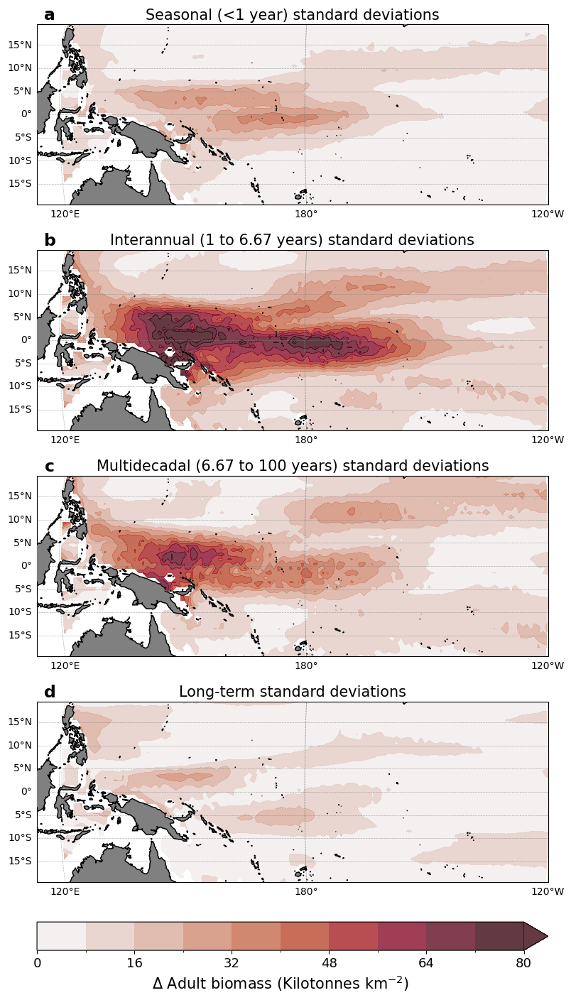

In [6]:
%%time

fstic = 13
fslab = 15

proj = ccrs.Robinson(central_longitude=205)
colmap = lighten(cmo.amp, 0.8)
levs = np.arange(0,11,1)*8
norm = mcolors.BoundaryNorm(levs, ncolors=256)

fig = plt.figure(figsize=(10,16))
gs = GridSpec(4,1)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[1,0], projection=proj)
ax3 = plt.subplot(gs[2,0], projection=proj)
ax4 = plt.subplot(gs[3,0], projection=proj)

p1 = ax1.contourf(lons, lats, ds_hf['adult_HF'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm, levels=levs, extend='max')
p2 = ax2.contourf(lons, lats, ds_mf['adult_MF'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm, levels=levs, extend='max')
p3 = ax3.contourf(lons, lats, ds_lf['adult_LF'].mean(dim='season').std(dim=['season_year']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm, levels=levs, extend='max')
p4 = ax4.contourf(lons, lats, ds_tr['adult_T'].mean(dim='season').std(dim=['season_year']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm, levels=levs, extend='max')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"Seasonal (<1 year) standard deviations", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"Interannual (1 to 6.67 years) standard deviations", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"Multidecadal (6.67 to 100 years) standard deviations", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"Long-term standard deviations", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=0.25, left=0.05, right=0.88, bottom=0.125)

pos1 = ax4.get_position()
cbax1 = fig.add_axes([pos1.x0,pos1.y0-0.06,pos1.x1 - pos1.x0, 0.025])
cbar1 = plt.colorbar(p1, cax=cbax1, orientation='horizontal', ticks=levs[::2])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_xlabel("$\Delta$ Adult biomass (Kilotonnes km$^{-2}$)", fontsize=fslab)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)

fig.savefig("./figures/StandardDeviaton_AdultAnomalies_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/StandardDeviaton_AdultAnomalies_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)




### investigate the standard deviations of the predictors under the different climate frequencies

/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctio

CPU times: user 16.4 s, sys: 1.91 s, total: 18.4 s
Wall time: 15.4 s


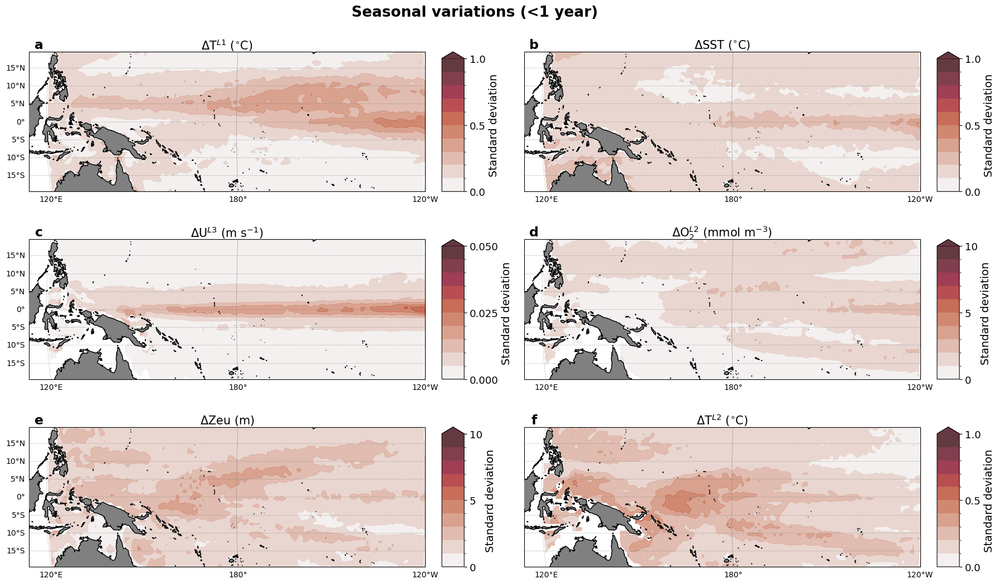

In [7]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.amp, 0.8)

levs1 = np.arange(0,11,1)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(0,11,1)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(0,11,1)*0.005
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(0,11,1)*1.0
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(0,11,1)*1.0
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)
levs6 = np.arange(0,11,1)*0.1
norm6 = mcolors.BoundaryNorm(levs6, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, ds_hf['T_L1'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='max')
p2 = ax2.contourf(lons, lats, ds_hf['sst'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='max')
p3 = ax3.contourf(lons, lats, ds_hf['U_L3'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm3, levels=levs3, extend='max')
p4 = ax4.contourf(lons, lats, ds_hf['O2_L2'].std(dim=['season_year','season']).T*44.661, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm4, levels=levs4, extend='max')
p5 = ax5.contourf(lons, lats, ds_hf['zeu'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm5, levels=levs5, extend='max')
p6 = ax6.contourf(lons, lats, ds_hf['T_L2'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm6, levels=levs6, extend='max')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.25, hspace=0.05, left=0.1, right=0.9, bottom=0.05)

pos1 = ax1.get_position()
pos2 = ax2.get_position()
pos3 = ax3.get_position()
pos4 = ax4.get_position()
pos5 = ax5.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos1.x1+0.015,pos1.y0,0.02,pos1.y1-pos1.y0])
cbax2 = fig.add_axes([pos2.x1+0.015,pos2.y0,0.02,pos2.y1-pos2.y0])
cbax3 = fig.add_axes([pos3.x1+0.015,pos3.y0,0.02,pos3.y1-pos3.y0])
cbax4 = fig.add_axes([pos4.x1+0.015,pos4.y0,0.02,pos4.y1-pos4.y0])
cbax5 = fig.add_axes([pos5.x1+0.015,pos5.y0,0.02,pos5.y1-pos5.y0])
cbax6 = fig.add_axes([pos6.x1+0.015,pos6.y0,0.02,pos6.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar2 = plt.colorbar(p2, cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar3 = plt.colorbar(p3, cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar4 = plt.colorbar(p4, cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar5 = plt.colorbar(p5, cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar6 = plt.colorbar(p6, cax=cbax6, orientation='vertical', ticks=levs6[::5])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

plt.text(0.5,0.91, "Seasonal variations (<1 year)", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/StandardDeviaton_Oceanography_IMFs_highfreq.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/StandardDeviaton_Oceanography_IMFs_highfreq_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctio

CPU times: user 16.7 s, sys: 2.07 s, total: 18.8 s
Wall time: 15.7 s


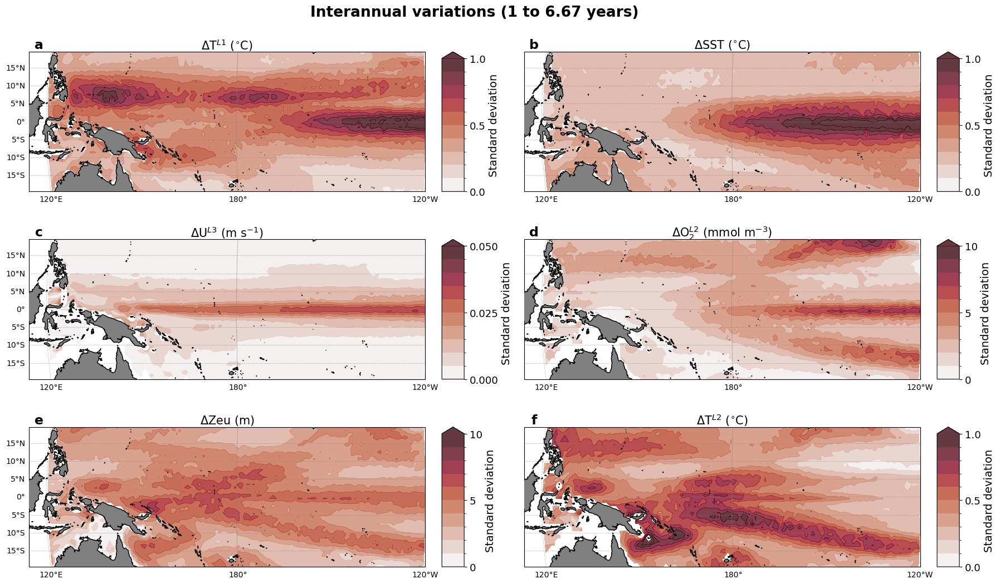

In [8]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.amp, 0.8)

levs1 = np.arange(0,11,1)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(0,11,1)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(0,11,1)*0.005
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(0,11,1)*1.0
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(0,11,1)*1.0
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)
levs6 = np.arange(0,11,1)*0.1
norm6 = mcolors.BoundaryNorm(levs6, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, ds_mf['T_L1'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='max')
p2 = ax2.contourf(lons, lats, ds_mf['sst'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='max')
p3 = ax3.contourf(lons, lats, ds_mf['U_L3'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm3, levels=levs3, extend='max')
p4 = ax4.contourf(lons, lats, ds_mf['O2_L2'].std(dim=['season_year','season']).T*44.661, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm4, levels=levs4, extend='max')
p5 = ax5.contourf(lons, lats, ds_mf['zeu'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm5, levels=levs5, extend='max')
p6 = ax6.contourf(lons, lats, ds_mf['T_L2'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm6, levels=levs6, extend='max')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.25, hspace=0.05, left=0.1, right=0.9, bottom=0.05)

pos1 = ax1.get_position()
pos2 = ax2.get_position()
pos3 = ax3.get_position()
pos4 = ax4.get_position()
pos5 = ax5.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos1.x1+0.015,pos1.y0,0.02,pos1.y1-pos1.y0])
cbax2 = fig.add_axes([pos2.x1+0.015,pos2.y0,0.02,pos2.y1-pos2.y0])
cbax3 = fig.add_axes([pos3.x1+0.015,pos3.y0,0.02,pos3.y1-pos3.y0])
cbax4 = fig.add_axes([pos4.x1+0.015,pos4.y0,0.02,pos4.y1-pos4.y0])
cbax5 = fig.add_axes([pos5.x1+0.015,pos5.y0,0.02,pos5.y1-pos5.y0])
cbax6 = fig.add_axes([pos6.x1+0.015,pos6.y0,0.02,pos6.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar2 = plt.colorbar(p2, cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar3 = plt.colorbar(p3, cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar4 = plt.colorbar(p4, cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar5 = plt.colorbar(p5, cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar6 = plt.colorbar(p6, cax=cbax6, orientation='vertical', ticks=levs6[::5])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

plt.text(0.5,0.91, "Interannual variations (1 to 6.67 years)", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/StandardDeviaton_Oceanography_IMFs_midfreq.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/StandardDeviaton_Oceanography_IMFs_midfreq_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/numpy/lib/_nanfunctio

CPU times: user 17.8 s, sys: 2.23 s, total: 20 s
Wall time: 16.8 s


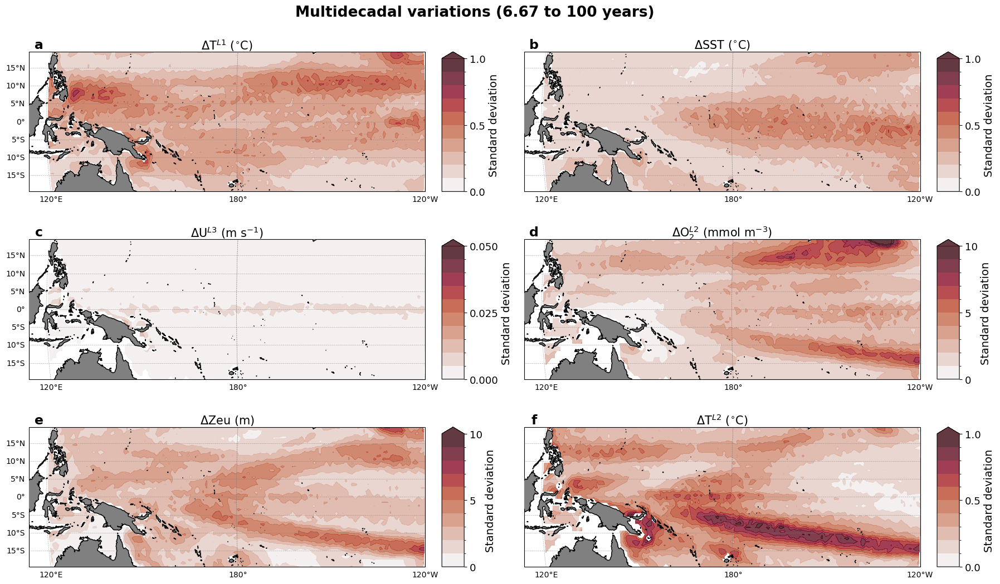

In [9]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.amp, 0.8)

levs1 = np.arange(0,11,1)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(0,11,1)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(0,11,1)*0.005
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(0,11,1)*1.0
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(0,11,1)*1.0
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)
levs6 = np.arange(0,11,1)*0.1
norm6 = mcolors.BoundaryNorm(levs6, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, ds_lf['T_L1'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='max')
p2 = ax2.contourf(lons, lats, ds_lf['sst'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='max')
p3 = ax3.contourf(lons, lats, ds_lf['U_L3'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm3, levels=levs3, extend='max')
p4 = ax4.contourf(lons, lats, ds_lf['O2_L2'].std(dim=['season_year','season']).T*44.661, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm4, levels=levs4, extend='max')
p5 = ax5.contourf(lons, lats, ds_lf['zeu'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm5, levels=levs5, extend='max')
p6 = ax6.contourf(lons, lats, ds_lf['T_L2'].std(dim=['season_year','season']).T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm6, levels=levs6, extend='max')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.25, hspace=0.05, left=0.1, right=0.9, bottom=0.05)

pos1 = ax1.get_position()
pos2 = ax2.get_position()
pos3 = ax3.get_position()
pos4 = ax4.get_position()
pos5 = ax5.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos1.x1+0.015,pos1.y0,0.02,pos1.y1-pos1.y0])
cbax2 = fig.add_axes([pos2.x1+0.015,pos2.y0,0.02,pos2.y1-pos2.y0])
cbax3 = fig.add_axes([pos3.x1+0.015,pos3.y0,0.02,pos3.y1-pos3.y0])
cbax4 = fig.add_axes([pos4.x1+0.015,pos4.y0,0.02,pos4.y1-pos4.y0])
cbax5 = fig.add_axes([pos5.x1+0.015,pos5.y0,0.02,pos5.y1-pos5.y0])
cbax6 = fig.add_axes([pos6.x1+0.015,pos6.y0,0.02,pos6.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar2 = plt.colorbar(p2, cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar3 = plt.colorbar(p3, cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar4 = plt.colorbar(p4, cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar5 = plt.colorbar(p5, cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar6 = plt.colorbar(p6, cax=cbax6, orientation='vertical', ticks=levs6[::5])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

plt.text(0.5,0.91, "Multidecadal variations (6.67 to 100 years)", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/StandardDeviaton_Oceanography_IMFs_lowfreq.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/StandardDeviaton_Oceanography_IMFs_lowfreq_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


CPU times: user 15.2 s, sys: 1.79 s, total: 17 s
Wall time: 14.3 s


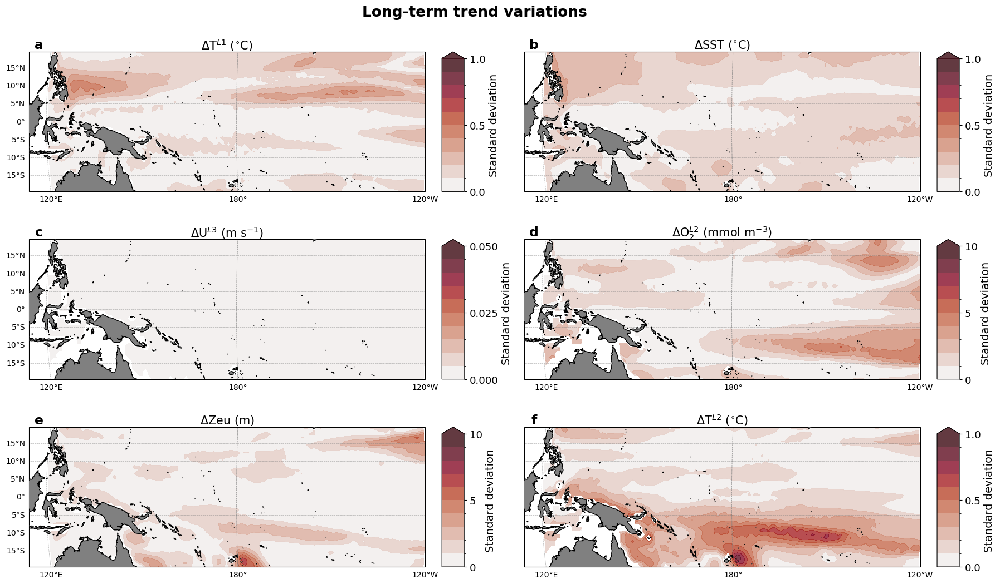

In [10]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.amp, 0.8)

levs1 = np.arange(0,11,1)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(0,11,1)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(0,11,1)*0.005
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(0,11,1)*1.0
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(0,11,1)*1.0
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)
levs6 = np.arange(0,11,1)*0.1
norm6 = mcolors.BoundaryNorm(levs6, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, ds_tr['T_L1'].mean(dim='season').std(dim='season_year').T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='max')
p2 = ax2.contourf(lons, lats, ds_tr['sst'].mean(dim='season').std(dim='season_year').T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='max')
p3 = ax3.contourf(lons, lats, ds_tr['U_L3'].mean(dim='season').std(dim='season_year').T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm3, levels=levs3, extend='max')
p4 = ax4.contourf(lons, lats, ds_tr['O2_L2'].mean(dim='season').std(dim='season_year').T*44.661, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm4, levels=levs4, extend='max')
p5 = ax5.contourf(lons, lats, ds_tr['zeu'].mean(dim='season').std(dim='season_year').T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm5, levels=levs5, extend='max')
p6 = ax6.contourf(lons, lats, ds_tr['T_L2'].mean(dim='season').std(dim='season_year').T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm6, levels=levs6, extend='max')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.25, hspace=0.05, left=0.1, right=0.9, bottom=0.05)

pos1 = ax1.get_position()
pos2 = ax2.get_position()
pos3 = ax3.get_position()
pos4 = ax4.get_position()
pos5 = ax5.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos1.x1+0.015,pos1.y0,0.02,pos1.y1-pos1.y0])
cbax2 = fig.add_axes([pos2.x1+0.015,pos2.y0,0.02,pos2.y1-pos2.y0])
cbax3 = fig.add_axes([pos3.x1+0.015,pos3.y0,0.02,pos3.y1-pos3.y0])
cbax4 = fig.add_axes([pos4.x1+0.015,pos4.y0,0.02,pos4.y1-pos4.y0])
cbax5 = fig.add_axes([pos5.x1+0.015,pos5.y0,0.02,pos5.y1-pos5.y0])
cbax6 = fig.add_axes([pos6.x1+0.015,pos6.y0,0.02,pos6.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar2 = plt.colorbar(p2, cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar3 = plt.colorbar(p3, cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar4 = plt.colorbar(p4, cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar5 = plt.colorbar(p5, cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

cbar6 = plt.colorbar(p6, cax=cbax6, orientation='vertical', ticks=levs6[::5])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_ylabel("Standard deviation", fontsize=fslab-1)

plt.text(0.5,0.91, "Long-term trend variations", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/StandardDeviaton_Oceanography_IMFs_trend.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/StandardDeviaton_Oceanography_IMFs_trend_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



### Linear trends of all 6 predictors

In [11]:
%%time

def linregress_1d(y, x):
    """
    y: 1D array of the variable
    x: 1D array of time (numeric)
    Returns: [slope, intercept, rvalue, pvalue, stderr]
    """
    y = np.asarray(y)
    x = np.asarray(x)

    mask = np.isfinite(y) & np.isfinite(x)
    if mask.sum() < 3:  # not enough data
        return np.array([np.nan, np.nan, np.nan, np.nan, np.nan])

    res = sci.stats.linregress(x[mask], y[mask])
    return np.array([res.slope, res.intercept, res.rvalue, res.pvalue, res.stderr])

time_years = ds_tr['season_year'].astype(float)


CPU times: user 838 μs, sys: 0 ns, total: 838 μs
Wall time: 865 μs


In [12]:
%%time

T_L1 = xr.apply_ufunc(
    linregress_1d,
    ds_tr['T_L1'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)
sst = xr.apply_ufunc(
    linregress_1d,
    ds_tr['sst'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)
U_L3 = xr.apply_ufunc(
    linregress_1d,
    ds_tr['U_L3'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)
O2_L2 = xr.apply_ufunc(
    linregress_1d,
    ds_tr['O2_L2'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)
zeu = xr.apply_ufunc(
    linregress_1d,
    ds_tr['zeu'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)
T_L2 = xr.apply_ufunc(
    linregress_1d,
    ds_tr['T_L2'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)

T_L1 = T_L1.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])
sst = sst.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])
U_L3 = U_L3.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])
O2_L2 = O2_L2.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])
zeu = zeu.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])
T_L2 = T_L2.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])

T_L1_slope = T_L1.sel(stat="slope")
T_L1_pvals = T_L1.sel(stat="p")
sst_slope = sst.sel(stat="slope")
sst_pvals = sst.sel(stat="p")
U_L3_slope = U_L3.sel(stat="slope")
U_L3_pvals = U_L3.sel(stat="p")
O2_L2_slope = O2_L2.sel(stat="slope")
O2_L2_pvals = O2_L2.sel(stat="p")
zeu_slope = zeu.sel(stat="slope")
zeu_pvals = zeu.sel(stat="p")
T_L2_slope = T_L2.sel(stat="slope")
T_L2_pvals = T_L2.sel(stat="p")



CPU times: user 7.87 s, sys: 1.18 s, total: 9.04 s
Wall time: 15.2 s


/g/data/es60/pjb581/miniforge3/envs/pyEMD_env/lib/python3.10/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


CPU times: user 18 s, sys: 2.37 s, total: 20.4 s
Wall time: 17.1 s


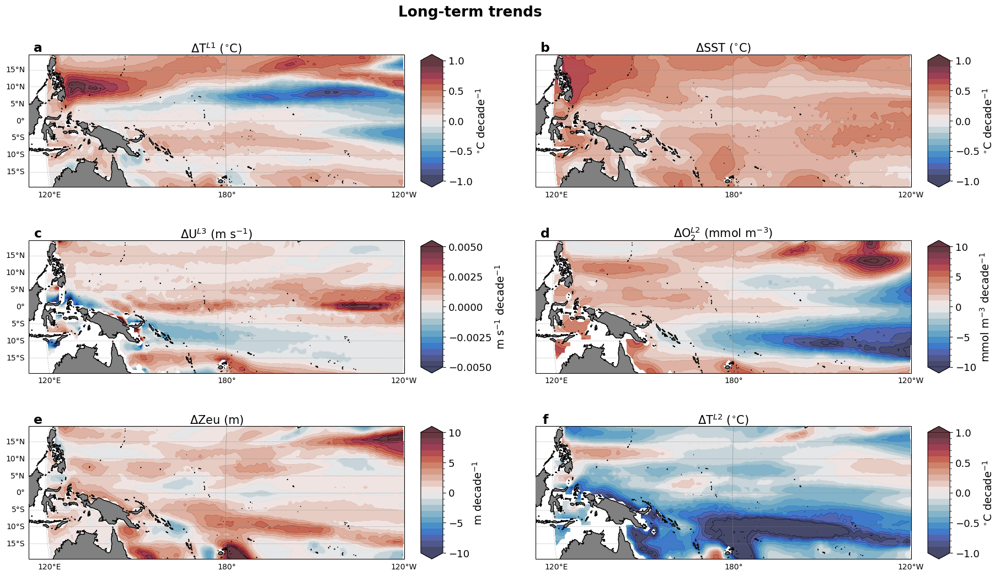

In [13]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,1)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(-10,11,1)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(-10,11,1)*0.0005
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(-10,11,1)*1.0
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(-10,11,1)*1.0
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)
levs6 = np.arange(-10,11,1)*0.1
norm6 = mcolors.BoundaryNorm(levs6, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, T_L1_slope.T*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p2 = ax2.contourf(lons, lats, sst_slope.T*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p3 = ax3.contourf(lons, lats, U_L3_slope.T*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm3, levels=levs3, extend='both')
p4 = ax4.contourf(lons, lats, O2_L2_slope.T*10*4*44.661, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm4, levels=levs4, extend='both')
p5 = ax5.contourf(lons, lats, zeu_slope.T*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm5, levels=levs5, extend='both')
p6 = ax6.contourf(lons, lats, T_L2_slope.T*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm6, levels=levs6, extend='both')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.35, hspace=0.05, left=0.1, right=0.9, bottom=0.05)

pos1 = ax1.get_position()
pos2 = ax2.get_position()
pos3 = ax3.get_position()
pos4 = ax4.get_position()
pos5 = ax5.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos1.x1+0.015,pos1.y0,0.02,pos1.y1-pos1.y0])
cbax2 = fig.add_axes([pos2.x1+0.015,pos2.y0,0.02,pos2.y1-pos2.y0])
cbax3 = fig.add_axes([pos3.x1+0.015,pos3.y0,0.02,pos3.y1-pos3.y0])
cbax4 = fig.add_axes([pos4.x1+0.015,pos4.y0,0.02,pos4.y1-pos4.y0])
cbax5 = fig.add_axes([pos5.x1+0.015,pos5.y0,0.02,pos5.y1-pos5.y0])
cbax6 = fig.add_axes([pos6.x1+0.015,pos6.y0,0.02,pos6.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$^{\circ}$C decade$^{-1}$", fontsize=fslab-1)

cbar2 = plt.colorbar(p2, cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$^{\circ}$C decade$^{-1}$", fontsize=fslab-1)

cbar3 = plt.colorbar(p3, cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("m s$^{-1}$ decade$^{-1}$", fontsize=fslab-1)

cbar4 = plt.colorbar(p4, cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("mmol m$^{-3}$ decade$^{-1}$", fontsize=fslab-1)

cbar5 = plt.colorbar(p5, cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("m decade$^{-1}$", fontsize=fslab-1)

cbar6 = plt.colorbar(p6, cax=cbax6, orientation='vertical', ticks=levs6[::5])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_ylabel("$^{\circ}$C decade$^{-1}$", fontsize=fslab-1)

plt.text(0.5,0.91, "Long-term trends", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/LinearTrends_Oceanography_IMFs.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/LinearTrends_Oceanography_IMFs_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



### Determine HOW mid-frequency and low-frequency oscillations correlate with ENSO and the IPO

#### Load ENSO and IPO indices

In [14]:
%%time

dates = pd.date_range(start="1958-01-01", end="2024-12-31", freq="M")

##### IPO #######
### Comes from "obs_derive_IPO.ipynb"
my_ipo = xr.open_dataset(wrkdir + "/derived_IPO.nc")['IPO']
#my_ipo_pos = my_ipo.where(my_ipo > 0.0, other=0.0)
#my_ipo_neg = my_ipo.where(my_ipo < 0.0, other=0.0)

##### ENSO #######
'''
https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_v5.php
'''
enso_index = pd.read_csv(wrkdir + "/ONI.txt", delimiter=', ')
enso_subset = enso_index[(enso_index['YR']>1957) & (enso_index['YR']<2025)]
enso = pd.DataFrame(
    {"time": dates,
     "index": enso_subset.drop(columns=['SEAS','YR']).squeeze(),
    }
)
#enso['pos'] = enso['index'][enso['index']>0.0]
#enso['neg'] = enso['index'][enso['index']<0.0]

###### CO2 #######
atmco2 = pd.read_table(wrkdir + "/CO2.txt", skiprows=40, delimiter=',')
atmco2


<timed exec>:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.


CPU times: user 326 ms, sys: 94.1 ms, total: 420 ms
Wall time: 899 ms


<timed exec>:13: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.


,year,month,date,measured,average
0,1958,3,1958.2027,315.71,314.44
1,1958,4,1958.2877,317.45,315.16
2,1958,5,1958.3699,317.51,314.69
3,1958,6,1958.4548,317.27,315.15
4,1958,7,1958.5370,315.87,315.20
...,...,...,...,...,...
807,2025,6,2025.4583,429.61,427.16
808,2025,7,2025.5417,427.87,427.46
809,2025,8,2025.6250,425.48,427.37
810,2025,9,2025.7083,424.37,427.78


#### Convert both IPO and ENSO indices into a seasonal mean timeseries

In [15]:
%%time

#### IPO ####
my_ipo = my_ipo.assign_coords(season=my_ipo['time'].dt.season)
year = my_ipo['time'].dt.year
season = my_ipo['season']
season_year = xr.where((season == 'DJF') & (my_ipo['time'].dt.month == 12), year + 1, year)
my_ipo = my_ipo.assign_coords(season_year=season_year)
ipo_da = my_ipo.groupby(['season_year', 'season']).mean('time')
ipo_da = ipo_da.sel(season_year=slice(1960,2022))

### ENSO ####
enso_subset['SEAS'] = enso_subset['SEAS'].replace({
    "NDJ": 'DJF',
    "DJF": 'DJF',
    "JFM": 'DJF',
    "FMA": 'MAM',
    "MAM": 'MAM',
    "AMJ": 'MAM',
    "MJJ": 'JJA',
    "JJA": 'JJA',
    "JAS": 'JJA',
    "ASO": 'SON',
    "SON": 'SON',
    "OND": 'SON'
})
enso_season_df = (
    enso_subset
    .groupby(['YR', 'SEAS'])['ANOM']
    .mean()
    .unstack('SEAS')          # index=YR, columns=SEAS
)
enso_ds = enso_season_df.to_xarray()
enso_da = enso_ds.to_array(dim='season')
enso_da = enso_da.rename({'YR': 'season_year'}).transpose('season_year', 'season').sel(season_year=slice(1960,2022))

### CO2 ####
atmco2['month'] = atmco2['month'].replace({
    12: 'DJF',
    1: 'DJF',
    2: 'DJF',
    3: 'MAM',
    4: 'MAM',
    5: 'MAM',
    6: 'JJA',
    7: 'JJA',
    8: 'JJA',
    9: 'SON',
    10: 'SON',
    11: 'SON'
})
atmco2_df = (
    atmco2
    .groupby(['year', 'month'])['average']
    .mean()
    .unstack('month')          # index=YR, columns=SEAS
)

atmco2_ds = atmco2_df.to_xarray()
atmco2_da = atmco2_ds.to_array(dim='month')
atmco2_da = atmco2_da.rename({'year': 'season_year', 'month':'season'}).transpose('season_year', 'season').sel(season_year=slice(1960,2022))



CPU times: user 260 ms, sys: 37.3 ms, total: 297 ms
Wall time: 270 ms


<timed exec>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


#### Find the correlations between the predictors at different frequencies with ENSO and IPO!

In [16]:
ds_hf = ds_mf.assign_coords(season_year=np.arange(1960,2023,1))
ds_mf = ds_mf.assign_coords(season_year=np.arange(1960,2023,1))
ds_lf = ds_lf.assign_coords(season_year=np.arange(1960,2023,1))
ds_tr = ds_tr.assign_coords(season_year=np.arange(1960,2023,1))

ds_mf


<xarray.Dataset> Size: 165MB
Dimensions:            (lon: 120, lat: 40, season_year: 63, season: 4)
Coordinates:
  * lon                (lon) float64 960B 120.5 121.5 122.5 ... 238.5 239.5
  * lat                (lat) float64 320B -19.5 -18.5 -17.5 ... 17.5 18.5 19.5
  * season             (season) object 32B 'DJF' 'JJA' 'MAM' 'SON'
  * season_year        (season_year) int64 504B 1960 1961 1962 ... 2021 2022
Data variables: (12/17)
    sst                (lon, lat, season_year, season) float64 10MB -0.05296 ...
    T_L1               (lon, lat, season_year, season) float64 10MB -0.1582 ....
    T_L2               (lon, lat, season_year, season) float64 10MB nan ... -...
    U_L3               (lon, lat, season_year, season) float64 10MB nan ... 0...
    zeu                (lon, lat, season_year, season) float64 10MB 0.009258 ...
    O2_L2              (lon, lat, season_year, season) float64 10MB nan ... 0...
    ...                 ...
    adultTF_O2_L2      (lon, lat, season_year, season) float64 10MB nan ... 0...
    adultTF_zeu        (lon, lat, season_year, season) float64 10MB nan ... 0...
    adultTF_T_L2       (lon, lat, season_year, season) float64 10MB nan ... 0...
    adultTF_intercept  (lon, lat, season_year, season) float64 10MB -0.000761...
    adult_MF           (lon, lat, season_year, season) float64 10MB nan ... -...
    adult_MF_se        (lon, lat, season_year, season) float64 10MB nan ... 1...

In [17]:
%%time

import warnings
warnings.filterwarnings("ignore")

### correlations
enso_T_L1_corr = xr.corr(enso_da, ds_mf['T_L1'], dim=['season_year', 'season'])
enso_sst_corr = xr.corr(enso_da, ds_mf['sst'], dim=['season_year', 'season'])
enso_U_L3_corr = xr.corr(enso_da, ds_mf['U_L3'], dim=['season_year', 'season'])
enso_O2_L2_corr = xr.corr(enso_da, ds_mf['O2_L2'], dim=['season_year', 'season'])
enso_zeu_corr = xr.corr(enso_da, ds_mf['zeu'], dim=['season_year', 'season'])
enso_T_L2_corr = xr.corr(enso_da, ds_mf['T_L2'], dim=['season_year', 'season'])

ipo_T_L1_corr = xr.corr(ipo_da, ds_lf['T_L1'], dim=['season_year', 'season'])
ipo_sst_corr = xr.corr(ipo_da, ds_lf['sst'], dim=['season_year', 'season'])
ipo_U_L3_corr = xr.corr(ipo_da, ds_lf['U_L3'], dim=['season_year', 'season'])
ipo_O2_L2_corr = xr.corr(ipo_da, ds_lf['O2_L2'], dim=['season_year', 'season'])
ipo_zeu_corr = xr.corr(ipo_da, ds_lf['zeu'], dim=['season_year', 'season'])
ipo_T_L2_corr = xr.corr(ipo_da, ds_lf['T_L2'], dim=['season_year', 'season'])

cc_T_L1_corr = xr.corr(atmco2_da, ds_tr['T_L1'], dim=['season_year', 'season'])
cc_sst_corr = xr.corr(atmco2_da, ds_tr['sst'], dim=['season_year', 'season'])
cc_U_L3_corr = xr.corr(atmco2_da, ds_tr['U_L3'], dim=['season_year', 'season'])
cc_O2_L2_corr = xr.corr(atmco2_da, ds_tr['O2_L2'], dim=['season_year', 'season'])
cc_zeu_corr = xr.corr(atmco2_da, ds_tr['zeu'], dim=['season_year', 'season'])
cc_T_L2_corr = xr.corr(atmco2_da, ds_tr['T_L2'], dim=['season_year', 'season'])


### slopes of the effect
def xr_slope(x, y, dim):
    cov = xr.cov(x, y, dim=dim)
    var = y.var(dim=dim)
    return cov / var

enso_T_L1_slope = xr_slope(ds_mf['T_L1'], enso_da, dim=['season_year', 'season'])
enso_sst_slope  = xr_slope(ds_mf['sst'], enso_da, dim=['season_year', 'season'])
enso_U_L3_slope = xr_slope(ds_mf['U_L3'], enso_da, dim=['season_year', 'season'])
enso_O2_L2_slope = xr_slope(ds_mf['O2_L2'], enso_da, dim=['season_year', 'season'])
enso_zeu_slope   = xr_slope(ds_mf['zeu'], enso_da, dim=['season_year', 'season'])
enso_T_L2_slope  = xr_slope(ds_mf['T_L2'], enso_da, dim=['season_year', 'season'])

ipo_T_L1_slope = xr_slope(ds_lf['T_L1'], ipo_da, dim=['season_year', 'season'])
ipo_sst_slope  = xr_slope(ds_lf['sst'], ipo_da, dim=['season_year', 'season'])
ipo_U_L3_slope = xr_slope(ds_lf['U_L3'], ipo_da, dim=['season_year', 'season'])
ipo_O2_L2_slope = xr_slope(ds_lf['O2_L2'], ipo_da, dim=['season_year', 'season'])
ipo_zeu_slope   = xr_slope(ds_lf['zeu'], ipo_da, dim=['season_year', 'season'])
ipo_T_L2_slope  = xr_slope(ds_lf['T_L2'], ipo_da, dim=['season_year', 'season'])

cc_T_L1_slope = xr_slope(ds_tr['T_L1'], atmco2_da, dim=['season_year', 'season'])
cc_sst_slope  = xr_slope(ds_tr['sst'], atmco2_da, dim=['season_year', 'season'])
cc_U_L3_slope = xr_slope(ds_tr['U_L3'], atmco2_da, dim=['season_year', 'season'])
cc_O2_L2_slope = xr_slope(ds_tr['O2_L2'], atmco2_da, dim=['season_year', 'season'])
cc_zeu_slope   = xr_slope(ds_tr['zeu'], atmco2_da, dim=['season_year', 'season'])
cc_T_L2_slope  = xr_slope(ds_tr['T_L2'], atmco2_da, dim=['season_year', 'season'])


CPU times: user 2.2 s, sys: 116 ms, total: 2.32 s
Wall time: 1.81 s


CPU times: user 17.2 s, sys: 2.33 s, total: 19.6 s
Wall time: 16.3 s


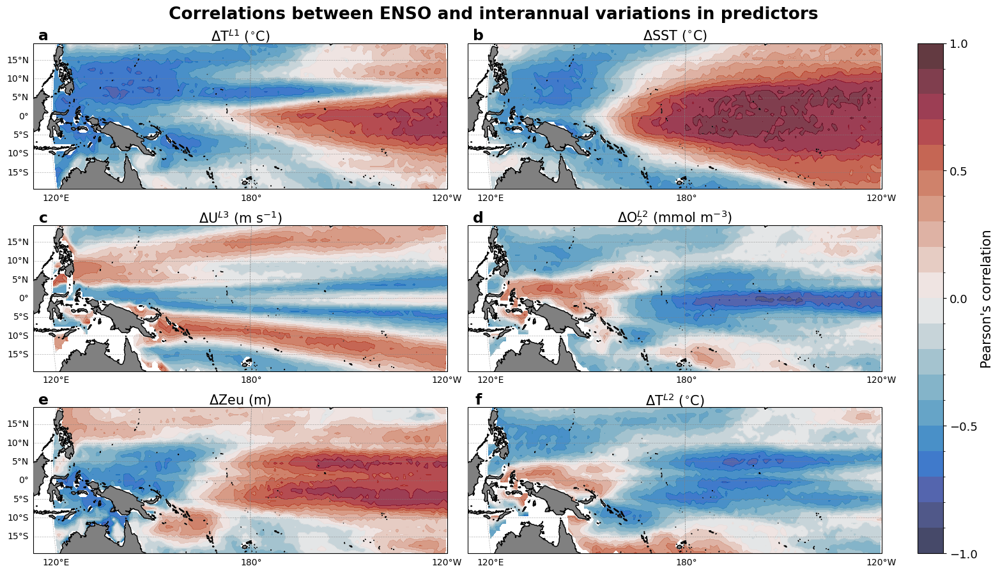

In [18]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,1)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)

fig = plt.figure(figsize=(16,10))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, enso_T_L1_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p2 = ax2.contourf(lons, lats, enso_sst_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p3 = ax3.contourf(lons, lats, enso_U_L3_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p4 = ax4.contourf(lons, lats, enso_O2_L2_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p5 = ax5.contourf(lons, lats, enso_zeu_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p6 = ax6.contourf(lons, lats, enso_T_L2_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=0.1, left=0.05, right=0.88, bottom=0.05)

pos2 = ax2.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos2.x1+0.035,pos6.y0,0.025,pos2.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Pearson's correlation", fontsize=fslab)

plt.text(0.5,0.91, "Correlations between ENSO and interannual variations in predictors", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/CorrelationsWithENSO_Oceanography_IMFs_midfreq.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/CorrelationsWithENSO_Oceanography_IMFs_midfreq_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



CPU times: user 15.5 s, sys: 1.87 s, total: 17.4 s
Wall time: 14.6 s


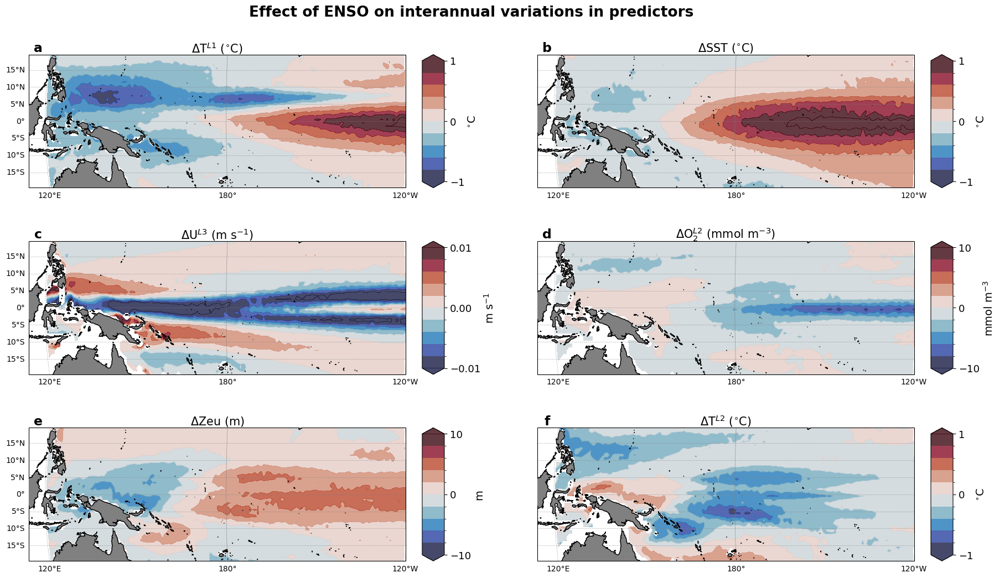

In [19]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,2)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(-10,11,2)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(-10,11,2)*0.001
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(-10,11,2)*1.0
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(-10,11,2)*1.0
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)
levs6 = np.arange(-10,11,2)*0.1
norm6 = mcolors.BoundaryNorm(levs6, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, enso_T_L1_slope.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p2 = ax2.contourf(lons, lats, enso_sst_slope.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p3 = ax3.contourf(lons, lats, enso_U_L3_slope.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm3, levels=levs3, extend='both')
p4 = ax4.contourf(lons, lats, enso_O2_L2_slope.T*44.661, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm4, levels=levs4, extend='both')
p5 = ax5.contourf(lons, lats, enso_zeu_slope.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm5, levels=levs5, extend='both')
p6 = ax6.contourf(lons, lats, enso_T_L2_slope.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm6, levels=levs6, extend='both')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.35, hspace=0.05, left=0.1, right=0.9, bottom=0.05)

pos1 = ax1.get_position()
pos2 = ax2.get_position()
pos3 = ax3.get_position()
pos4 = ax4.get_position()
pos5 = ax5.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos1.x1+0.015,pos1.y0,0.02,pos1.y1-pos1.y0])
cbax2 = fig.add_axes([pos2.x1+0.015,pos2.y0,0.02,pos2.y1-pos2.y0])
cbax3 = fig.add_axes([pos3.x1+0.015,pos3.y0,0.02,pos3.y1-pos3.y0])
cbax4 = fig.add_axes([pos4.x1+0.015,pos4.y0,0.02,pos4.y1-pos4.y0])
cbax5 = fig.add_axes([pos5.x1+0.015,pos5.y0,0.02,pos5.y1-pos5.y0])
cbax6 = fig.add_axes([pos6.x1+0.015,pos6.y0,0.02,pos6.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$^{\circ}$C", fontsize=fslab-1)

cbar2 = plt.colorbar(p2, cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$^{\circ}$C", fontsize=fslab-1)

cbar3 = plt.colorbar(p3, cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("m s$^{-1}$", fontsize=fslab-1)

cbar4 = plt.colorbar(p4, cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("mmol m$^{-3}$", fontsize=fslab-1)

cbar5 = plt.colorbar(p5, cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("m", fontsize=fslab-1)

cbar6 = plt.colorbar(p6, cax=cbax6, orientation='vertical', ticks=levs6[::5])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_ylabel("$^{\circ}$C", fontsize=fslab-1)

plt.text(0.5,0.91, "Effect of ENSO on interannual variations in predictors", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/SlopesWithENSO_Oceanography_IMFs_midfreq.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/SlopesWithENSO_Oceanography_IMFs_midfreq_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



CPU times: user 22.6 s, sys: 3.35 s, total: 26 s
Wall time: 21.5 s


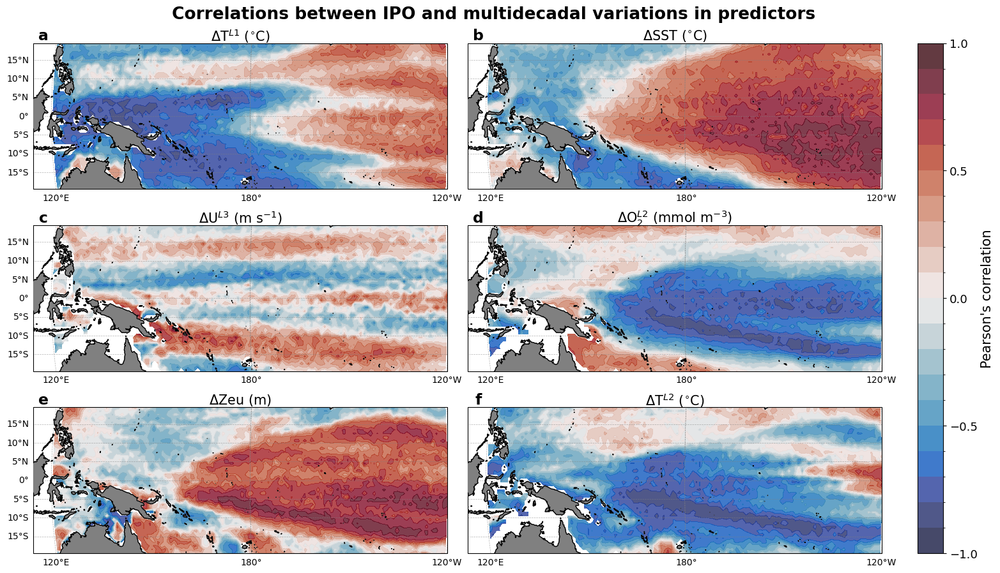

In [20]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,1)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)

fig = plt.figure(figsize=(16,10))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, ipo_T_L1_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p2 = ax2.contourf(lons, lats, ipo_sst_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p3 = ax3.contourf(lons, lats, ipo_U_L3_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p4 = ax4.contourf(lons, lats, ipo_O2_L2_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p5 = ax5.contourf(lons, lats, ipo_zeu_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p6 = ax6.contourf(lons, lats, ipo_T_L2_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=0.1, left=0.05, right=0.88, bottom=0.05)

pos2 = ax2.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos2.x1+0.035,pos6.y0,0.025,pos2.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Pearson's correlation", fontsize=fslab)

plt.text(0.5,0.91, "Correlations between IPO and multidecadal variations in predictors", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/CorrelationsWithIPO_Oceanography_IMFs_lowfreq.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/CorrelationsWithIPO_Oceanography_IMFs_lowfreq_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



CPU times: user 18.2 s, sys: 2.31 s, total: 20.5 s
Wall time: 17.1 s


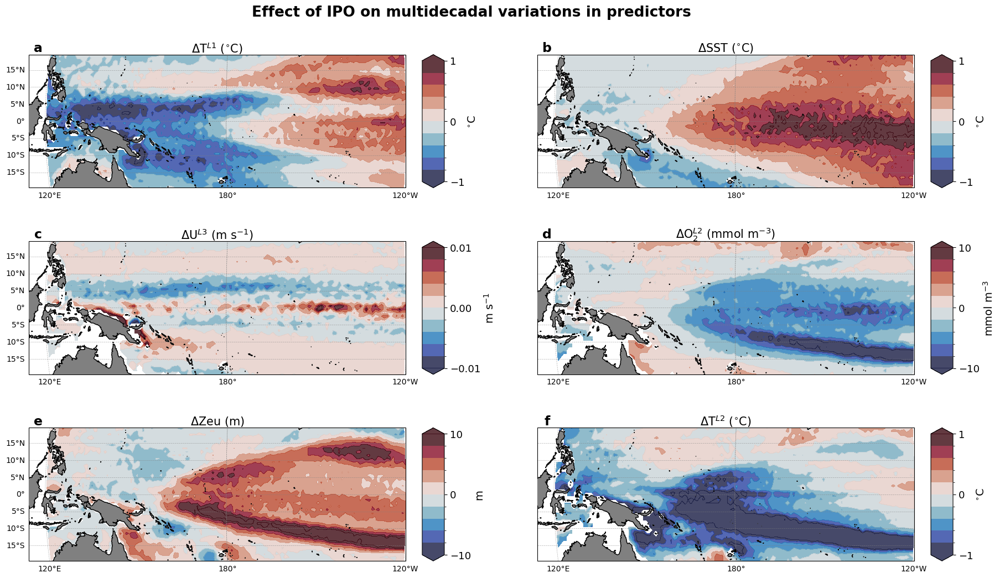

In [21]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,2)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(-10,11,2)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(-10,11,2)*0.001
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(-10,11,2)*1.0
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(-10,11,2)*1.0
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)
levs6 = np.arange(-10,11,2)*0.1
norm6 = mcolors.BoundaryNorm(levs6, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, ipo_T_L1_slope.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p2 = ax2.contourf(lons, lats, ipo_sst_slope.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p3 = ax3.contourf(lons, lats, ipo_U_L3_slope.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm3, levels=levs3, extend='both')
p4 = ax4.contourf(lons, lats, ipo_O2_L2_slope.T*44.661, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm4, levels=levs4, extend='both')
p5 = ax5.contourf(lons, lats, ipo_zeu_slope.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm5, levels=levs5, extend='both')
p6 = ax6.contourf(lons, lats, ipo_T_L2_slope.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm6, levels=levs6, extend='both')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.35, hspace=0.05, left=0.1, right=0.9, bottom=0.05)

pos1 = ax1.get_position()
pos2 = ax2.get_position()
pos3 = ax3.get_position()
pos4 = ax4.get_position()
pos5 = ax5.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos1.x1+0.015,pos1.y0,0.02,pos1.y1-pos1.y0])
cbax2 = fig.add_axes([pos2.x1+0.015,pos2.y0,0.02,pos2.y1-pos2.y0])
cbax3 = fig.add_axes([pos3.x1+0.015,pos3.y0,0.02,pos3.y1-pos3.y0])
cbax4 = fig.add_axes([pos4.x1+0.015,pos4.y0,0.02,pos4.y1-pos4.y0])
cbax5 = fig.add_axes([pos5.x1+0.015,pos5.y0,0.02,pos5.y1-pos5.y0])
cbax6 = fig.add_axes([pos6.x1+0.015,pos6.y0,0.02,pos6.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$^{\circ}$C", fontsize=fslab-1)

cbar2 = plt.colorbar(p2, cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$^{\circ}$C", fontsize=fslab-1)

cbar3 = plt.colorbar(p3, cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("m s$^{-1}$", fontsize=fslab-1)

cbar4 = plt.colorbar(p4, cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("mmol m$^{-3}$", fontsize=fslab-1)

cbar5 = plt.colorbar(p5, cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("m", fontsize=fslab-1)

cbar6 = plt.colorbar(p6, cax=cbax6, orientation='vertical', ticks=levs6[::5])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_ylabel("$^{\circ}$C", fontsize=fslab-1)

plt.text(0.5,0.91, "Effect of IPO on multidecadal variations in predictors", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/SlopesWithIPO_Oceanography_IMFs_lowfreq.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/SlopesWithIPO_Oceanography_IMFs_lowfreq_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



CPU times: user 16.6 s, sys: 2.28 s, total: 18.9 s
Wall time: 15.8 s


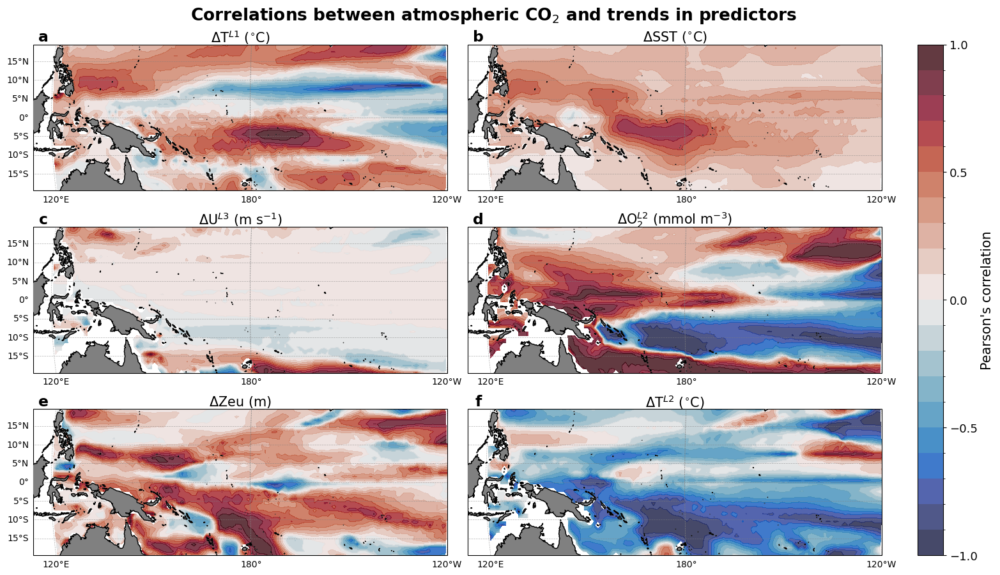

In [22]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,1)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)

fig = plt.figure(figsize=(16,10))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, cc_T_L1_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p2 = ax2.contourf(lons, lats, cc_sst_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p3 = ax3.contourf(lons, lats, cc_U_L3_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p4 = ax4.contourf(lons, lats, cc_O2_L2_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p5 = ax5.contourf(lons, lats, cc_zeu_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')
p6 = ax6.contourf(lons, lats, cc_T_L2_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='neither')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=0.1, left=0.05, right=0.88, bottom=0.05)

pos2 = ax2.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos2.x1+0.035,pos6.y0,0.025,pos2.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Pearson's correlation", fontsize=fslab)

plt.text(0.5,0.91, "Correlations between atmospheric CO$_2$ and trends in predictors", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/CorrelationsWithCO2_Oceanography_IMFs_trends.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/CorrelationsWithCO2_Oceanography_IMFs_trends_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



CPU times: user 15.5 s, sys: 1.88 s, total: 17.4 s
Wall time: 14.7 s


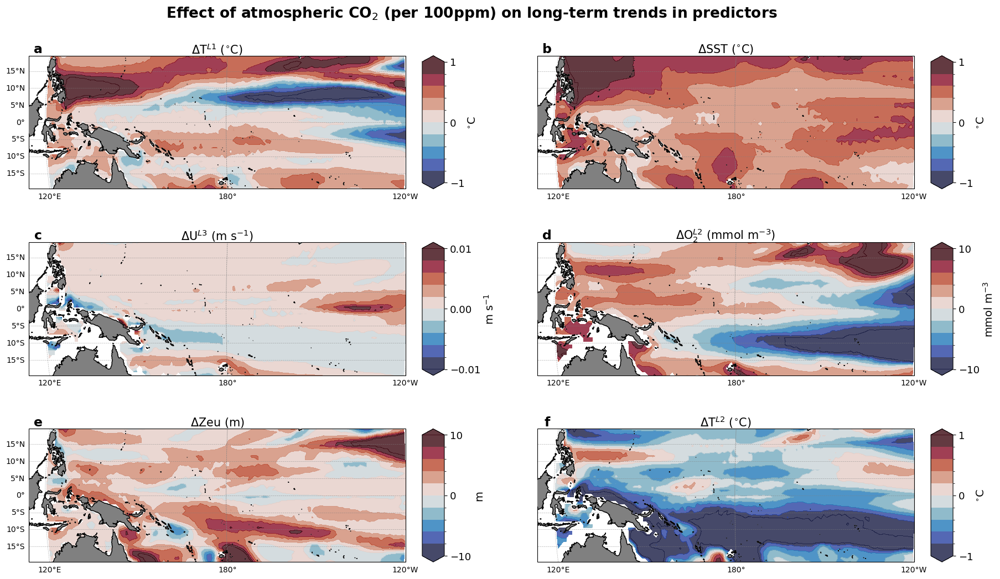

In [23]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,2)*0.1
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(-10,11,2)*0.1
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)
levs3 = np.arange(-10,11,2)*0.001
norm3 = mcolors.BoundaryNorm(levs3, ncolors=256)
levs4 = np.arange(-10,11,2)*1.0
norm4 = mcolors.BoundaryNorm(levs4, ncolors=256)
levs5 = np.arange(-10,11,2)*1.0
norm5 = mcolors.BoundaryNorm(levs5, ncolors=256)
levs6 = np.arange(-10,11,2)*0.1
norm6 = mcolors.BoundaryNorm(levs6, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, cc_T_L1_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p2 = ax2.contourf(lons, lats, cc_sst_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p3 = ax3.contourf(lons, lats, cc_U_L3_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm3, levels=levs3, extend='both')
p4 = ax4.contourf(lons, lats, cc_O2_L2_slope.T*100*44.661, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm4, levels=levs4, extend='both')
p5 = ax5.contourf(lons, lats, cc_zeu_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm5, levels=levs5, extend='both')
p6 = ax6.contourf(lons, lats, cc_T_L2_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm6, levels=levs6, extend='both')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$T$^{L1}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$SST ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$U$^{L3}$ (m s$^{-1}$)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$O$_2^{L2}$ (mmol m$^{-3}$)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Zeu (m)", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$T$^{L2}$ ($^{\circ}$C)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.35, hspace=0.05, left=0.1, right=0.9, bottom=0.05)

pos1 = ax1.get_position()
pos2 = ax2.get_position()
pos3 = ax3.get_position()
pos4 = ax4.get_position()
pos5 = ax5.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos1.x1+0.015,pos1.y0,0.02,pos1.y1-pos1.y0])
cbax2 = fig.add_axes([pos2.x1+0.015,pos2.y0,0.02,pos2.y1-pos2.y0])
cbax3 = fig.add_axes([pos3.x1+0.015,pos3.y0,0.02,pos3.y1-pos3.y0])
cbax4 = fig.add_axes([pos4.x1+0.015,pos4.y0,0.02,pos4.y1-pos4.y0])
cbax5 = fig.add_axes([pos5.x1+0.015,pos5.y0,0.02,pos5.y1-pos5.y0])
cbax6 = fig.add_axes([pos6.x1+0.015,pos6.y0,0.02,pos6.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::5])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$^{\circ}$C", fontsize=fslab-1)

cbar2 = plt.colorbar(p2, cax=cbax2, orientation='vertical', ticks=levs2[::5])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$^{\circ}$C", fontsize=fslab-1)

cbar3 = plt.colorbar(p3, cax=cbax3, orientation='vertical', ticks=levs3[::5])
cbar3.ax.tick_params(labelsize=fstic)
cbar3.ax.set_ylabel("m s$^{-1}$", fontsize=fslab-1)

cbar4 = plt.colorbar(p4, cax=cbax4, orientation='vertical', ticks=levs4[::5])
cbar4.ax.tick_params(labelsize=fstic)
cbar4.ax.set_ylabel("mmol m$^{-3}$", fontsize=fslab-1)

cbar5 = plt.colorbar(p5, cax=cbax5, orientation='vertical', ticks=levs5[::5])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_ylabel("m", fontsize=fslab-1)

cbar6 = plt.colorbar(p6, cax=cbax6, orientation='vertical', ticks=levs6[::5])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_ylabel("$^{\circ}$C", fontsize=fslab-1)

plt.text(0.5,0.91, "Effect of atmospheric CO$_2$ (per 100ppm) on long-term trends in predictors", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/SlopesWithCO2_Oceanography_IMFs_trends.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/SlopesWithCO2_Oceanography_IMFs_trends_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



### determine the correlation between ENSO and IPO with MF and LF variations in skipjack

In [24]:
ds_mf

<xarray.Dataset> Size: 165MB
Dimensions:            (lon: 120, lat: 40, season_year: 63, season: 4)
Coordinates:
  * lon                (lon) float64 960B 120.5 121.5 122.5 ... 238.5 239.5
  * lat                (lat) float64 320B -19.5 -18.5 -17.5 ... 17.5 18.5 19.5
  * season             (season) object 32B 'DJF' 'JJA' 'MAM' 'SON'
  * season_year        (season_year) int64 504B 1960 1961 1962 ... 2021 2022
Data variables: (12/17)
    sst                (lon, lat, season_year, season) float64 10MB -0.05296 ...
    T_L1               (lon, lat, season_year, season) float64 10MB -0.1582 ....
    T_L2               (lon, lat, season_year, season) float64 10MB nan ... -...
    U_L3               (lon, lat, season_year, season) float64 10MB nan ... 0...
    zeu                (lon, lat, season_year, season) float64 10MB 0.009258 ...
    O2_L2              (lon, lat, season_year, season) float64 10MB nan ... 0...
    ...                 ...
    adultTF_O2_L2      (lon, lat, season_year, season) float64 10MB nan ... 0...
    adultTF_zeu        (lon, lat, season_year, season) float64 10MB nan ... 0...
    adultTF_T_L2       (lon, lat, season_year, season) float64 10MB nan ... 0...
    adultTF_intercept  (lon, lat, season_year, season) float64 10MB -0.000761...
    adult_MF           (lon, lat, season_year, season) float64 10MB nan ... -...
    adult_MF_se        (lon, lat, season_year, season) float64 10MB nan ... 1...

In [25]:
%%time

enso_tuna_corr = xr.corr(enso_da, ds_mf['adult_MF'], dim=['season_year', 'season'])
ipo_tuna_corr = xr.corr(ipo_da, ds_lf['adult_LF'], dim=['season_year', 'season'])
cc_tuna_corr = xr.corr(atmco2_da, ds_tr['adult_T'], dim=['season_year', 'season'])

enso_tuna_slope = xr_slope(ds_mf['adult_MF'], enso_da, dim=['season_year', 'season'])
ipo_tuna_slope = xr_slope(ds_lf['adult_LF'], ipo_da, dim=['season_year', 'season'])
cc_tuna_slope = xr_slope(ds_tr['adult_T'], atmco2_da, dim=['season_year', 'season'])

### individual predictor relationships and ENSO
enso_T_L1_tuna_corr = xr.corr(enso_da, conv(ds_mf['adultTF_T_L1'])*1e3, dim=['season_year', 'season'])
enso_sst_tuna_corr = xr.corr(enso_da, conv(ds_mf['adultTF_sst'])*1e3, dim=['season_year', 'season'])
enso_U_L3_tuna_corr = xr.corr(enso_da, conv(ds_mf['adultTF_U_L3'])*1e3, dim=['season_year', 'season'])
enso_O2_L2_tuna_corr = xr.corr(enso_da, conv(ds_mf['adultTF_O2_L2'])*1e3, dim=['season_year', 'season'])
enso_zeu_tuna_corr = xr.corr(enso_da, conv(ds_mf['adultTF_zeu'])*1e3, dim=['season_year', 'season'])
enso_T_L2_tuna_corr = xr.corr(enso_da, conv(ds_mf['adultTF_T_L2'])*1e3, dim=['season_year', 'season'])

enso_T_L1_tuna_slope = xr_slope(conv(ds_mf['adultTF_T_L1'])*1e3, enso_da, dim=['season_year', 'season'])
enso_sst_tuna_slope = xr_slope(conv(ds_mf['adultTF_sst'])*1e3, enso_da, dim=['season_year', 'season'])
enso_U_L3_tuna_slope = xr_slope(conv(ds_mf['adultTF_U_L3'])*1e3, enso_da, dim=['season_year', 'season'])
enso_O2_L2_tuna_slope = xr_slope(conv(ds_mf['adultTF_O2_L2'])*1e3, enso_da, dim=['season_year', 'season'])
enso_zeu_tuna_slope = xr_slope(conv(ds_mf['adultTF_zeu'])*1e3, enso_da, dim=['season_year', 'season'])
enso_T_L2_tuna_slope = xr_slope(conv(ds_mf['adultTF_T_L2'])*1e3, enso_da, dim=['season_year', 'season'])

### individual predictor relationships and IPO
ipo_T_L1_tuna_corr = xr.corr(ipo_da, conv(ds_lf['adultTF_T_L1'])*1e3, dim=['season_year', 'season'])
ipo_sst_tuna_corr = xr.corr(ipo_da, conv(ds_lf['adultTF_sst'])*1e3, dim=['season_year', 'season'])
ipo_U_L3_tuna_corr = xr.corr(ipo_da, conv(ds_lf['adultTF_U_L3'])*1e3, dim=['season_year', 'season'])
ipo_O2_L2_tuna_corr = xr.corr(ipo_da, conv(ds_lf['adultTF_O2_L2'])*1e3, dim=['season_year', 'season'])
ipo_zeu_tuna_corr = xr.corr(ipo_da, conv(ds_lf['adultTF_zeu'])*1e3, dim=['season_year', 'season'])
ipo_T_L2_tuna_corr = xr.corr(ipo_da, conv(ds_lf['adultTF_T_L2'])*1e3, dim=['season_year', 'season'])

ipo_T_L1_tuna_slope = xr_slope(conv(ds_lf['adultTF_T_L1'])*1e3, ipo_da, dim=['season_year', 'season'])
ipo_sst_tuna_slope = xr_slope(conv(ds_lf['adultTF_sst'])*1e3, ipo_da, dim=['season_year', 'season'])
ipo_U_L3_tuna_slope = xr_slope(conv(ds_lf['adultTF_U_L3'])*1e3, ipo_da, dim=['season_year', 'season'])
ipo_O2_L2_tuna_slope = xr_slope(conv(ds_lf['adultTF_O2_L2'])*1e3, ipo_da, dim=['season_year', 'season'])
ipo_zeu_tuna_slope = xr_slope(conv(ds_lf['adultTF_zeu'])*1e3, ipo_da, dim=['season_year', 'season'])
ipo_T_L2_tuna_slope = xr_slope(conv(ds_lf['adultTF_T_L2'])*1e3, ipo_da, dim=['season_year', 'season'])

### individual predictor relationships and atmospheric CO2
cc_T_L1_tuna_corr = xr.corr(atmco2_da, conv(ds_tr['adultTF_T_L1'])*1e3, dim=['season_year', 'season'])
cc_sst_tuna_corr = xr.corr(atmco2_da, conv(ds_tr['adultTF_sst'])*1e3, dim=['season_year', 'season'])
cc_U_L3_tuna_corr = xr.corr(atmco2_da, conv(ds_tr['adultTF_U_L3'])*1e3, dim=['season_year', 'season'])
cc_O2_L2_tuna_corr = xr.corr(atmco2_da, conv(ds_tr['adultTF_O2_L2'])*1e3, dim=['season_year', 'season'])
cc_zeu_tuna_corr = xr.corr(atmco2_da, conv(ds_tr['adultTF_zeu'])*1e3, dim=['season_year', 'season'])
cc_T_L2_tuna_corr = xr.corr(atmco2_da, conv(ds_tr['adultTF_T_L2'])*1e3, dim=['season_year', 'season'])

cc_T_L1_tuna_slope = xr_slope(conv(ds_tr['adultTF_T_L1'])*1e3, atmco2_da, dim=['season_year', 'season'])
cc_sst_tuna_slope = xr_slope(conv(ds_tr['adultTF_sst'])*1e3, atmco2_da, dim=['season_year', 'season'])
cc_U_L3_tuna_slope = xr_slope(conv(ds_tr['adultTF_U_L3'])*1e3, atmco2_da, dim=['season_year', 'season'])
cc_O2_L2_tuna_slope = xr_slope(conv(ds_tr['adultTF_O2_L2'])*1e3, atmco2_da, dim=['season_year', 'season'])
cc_zeu_tuna_slope = xr_slope(conv(ds_tr['adultTF_zeu'])*1e3, atmco2_da, dim=['season_year', 'season'])
cc_T_L2_tuna_slope = xr_slope(conv(ds_tr['adultTF_T_L2'])*1e3, atmco2_da, dim=['season_year', 'season'])


time_years = ds_tr['season_year'].astype(float)
annual = xr.apply_ufunc(
    linregress_1d,
    ds_tr['adult_T'].mean(dim="season"),
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)

annual = annual.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])
slope_annual = annual.sel(stat="slope")
pvals_annual = annual.sel(stat="p")


CPU times: user 5.86 s, sys: 260 ms, total: 6.12 s
Wall time: 4.82 s


In [26]:
print(enso_da.std().values)
print(ipo_da.std().values)

0.7399930707972693
0.3715766752113246


CPU times: user 17.2 s, sys: 2.11 s, total: 19.3 s
Wall time: 16.1 s


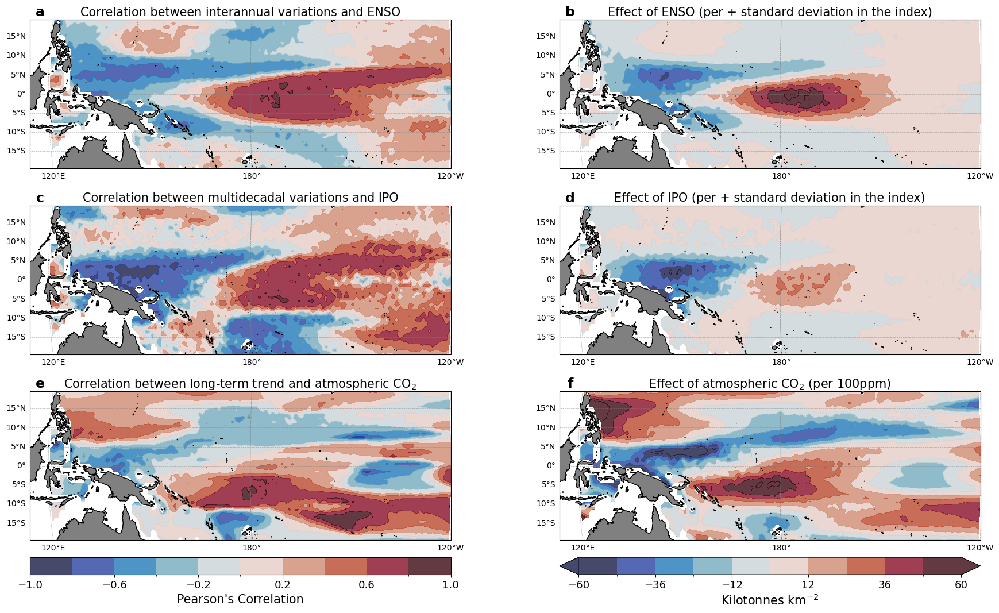

In [27]:
%%time

fstic = 13
fslab = 15

proj = ccrs.Robinson(central_longitude=205)
colmap = lighten(cmo.balance, 0.8)
levs = np.arange(-10,11,2)*0.1
norm = mcolors.BoundaryNorm(levs, ncolors=256)
levs2 = np.arange(-10,11,2)*6
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, enso_tuna_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm, levels=levs, extend='neither')
p3 = ax3.contourf(lons, lats, ipo_tuna_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm, levels=levs, extend='neither')
p5 = ax5.contourf(lons, lats, cc_tuna_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm, levels=levs, extend='neither')

p2 = ax2.contourf(lons, lats, enso_tuna_slope.T * enso_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p4 = ax4.contourf(lons, lats, ipo_tuna_slope.T * ipo_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p6 = ax6.contourf(lons, lats, cc_tuna_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')

#p3 = ax3.contourf(lons, lats, slope_annual.T*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
#c3 = ax3.contourf(lons, lats, pvals_annual.T, transform=ccrs.PlateCarree(), colors='none', levels=[0.0,0.05,1.0], hatches=[' ', '...'])

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"Correlation between interannual variations and ENSO", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"Correlation between multidecadal variations and IPO", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"Correlation between long-term trend and atmospheric CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"Effect of ENSO (per + standard deviation in the index)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"Effect of IPO (per + standard deviation in the index)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"Effect of atmospheric CO$_2$ (per 100ppm)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)
#plt.text(xx,yy,"Long-term trends (1960 - 2022)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=0.25, left=0.05, right=0.95, bottom=0.125)

pos5 = ax5.get_position()
pos6 = ax6.get_position()

cbax5 = fig.add_axes([pos5.x0,pos5.y0-0.05,pos5.x1-pos5.x0,0.025])
cbax6 = fig.add_axes([pos6.x0,pos6.y0-0.05,pos6.x1-pos6.x0,0.025])

cbar5 = plt.colorbar(p5, cax=cbax5, orientation='horizontal', ticks=levs[::2])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_xlabel("Pearson's Correlation", fontsize=fslab)
cbar6 = plt.colorbar(p6, cax=cbax6, orientation='horizontal', ticks=levs2[::2])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_xlabel("Kilotonnes km$^{-2}$", fontsize=fslab)


xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/ENSO_IPO_CorrelationsSlopes_AdultAnomalies.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/ENSO_IPO_CorrelationsSlopes_AdultAnomalies_transparent.png", dpi=300, bbox_inches='tight', transparent=True)




CPU times: user 15.2 s, sys: 1.78 s, total: 17 s
Wall time: 14.2 s


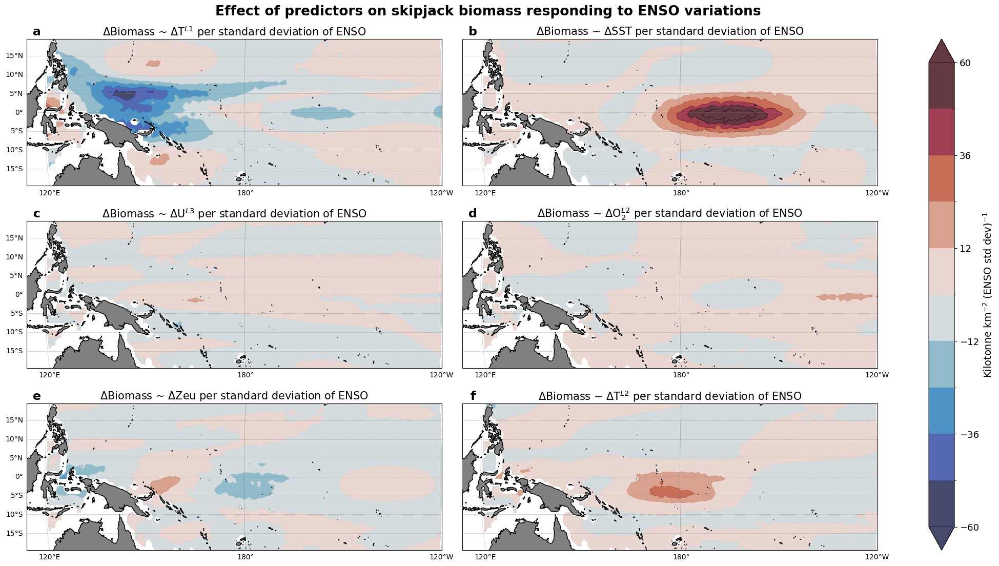

In [28]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,2)*6.0
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, enso_T_L1_tuna_slope.T * enso_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p2 = ax2.contourf(lons, lats, enso_sst_tuna_slope.T * enso_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p3 = ax3.contourf(lons, lats, enso_U_L3_tuna_slope.T * enso_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p4 = ax4.contourf(lons, lats, enso_O2_L2_tuna_slope.T * enso_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p5 = ax5.contourf(lons, lats, enso_zeu_tuna_slope.T * enso_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p6 = ax6.contourf(lons, lats, enso_T_L2_tuna_slope.T * enso_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$T$^{L1}$ per standard deviation of ENSO", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$SST per standard deviation of ENSO", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$U$^{L3}$ per standard deviation of ENSO", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$O$_2^{L2}$ per standard deviation of ENSO", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$Zeu per standard deviation of ENSO", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$T$^{L2}$ per standard deviation of ENSO", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=0.15, left=0.05, right=0.88, bottom=0.05, top=0.90)

pos2 = ax2.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos6.x1+0.05,pos6.y0,0.025,pos2.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::2])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Kilotonne km$^{-2}$ (ENSO std dev)$^{-1}$", fontsize=fslab-1)

plt.text(0.5,0.935, "Effect of predictors on skipjack biomass responding to ENSO variations", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/EffectsOfENSO_Oceanography_IMFs_midfreq.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/EffectsOfENSO_Oceanography_IMFs_midfreq_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



CPU times: user 15.4 s, sys: 1.86 s, total: 17.3 s
Wall time: 14.5 s


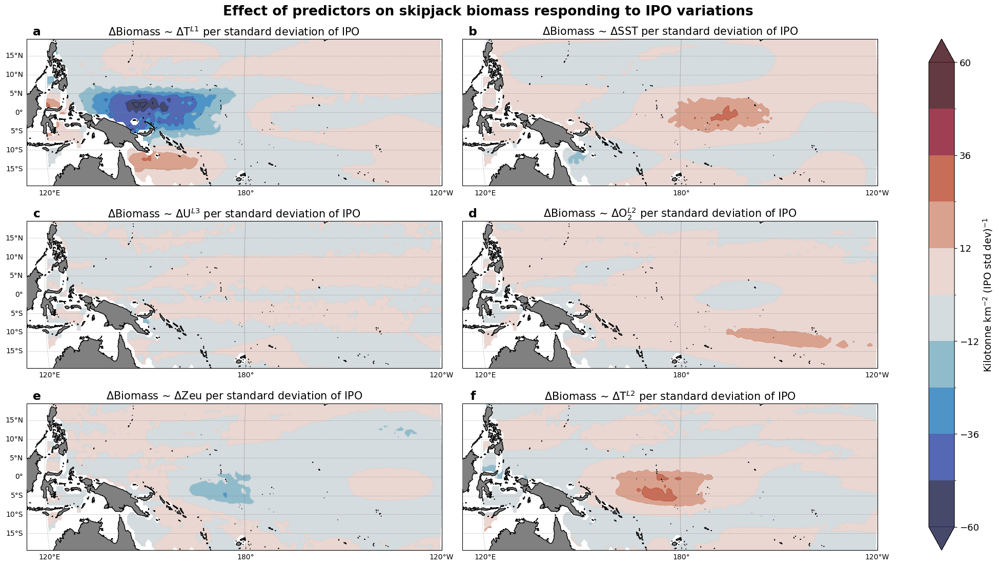

In [29]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,2)*6.0
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, ipo_T_L1_tuna_slope.T * ipo_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p2 = ax2.contourf(lons, lats, ipo_sst_tuna_slope.T * ipo_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p3 = ax3.contourf(lons, lats, ipo_U_L3_tuna_slope.T * ipo_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p4 = ax4.contourf(lons, lats, ipo_O2_L2_tuna_slope.T * ipo_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p5 = ax5.contourf(lons, lats, ipo_zeu_tuna_slope.T * ipo_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p6 = ax6.contourf(lons, lats, ipo_T_L2_tuna_slope.T * ipo_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$T$^{L1}$ per standard deviation of IPO", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$SST per standard deviation of IPO", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$U$^{L3}$ per standard deviation of IPO", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$O$_2^{L2}$ per standard deviation of IPO", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$Zeu per standard deviation of IPO", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$T$^{L2}$ per standard deviation of IPO", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=0.15, left=0.05, right=0.88, bottom=0.05, top=0.90)

pos2 = ax2.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos6.x1+0.05,pos6.y0,0.025,pos2.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::2])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Kilotonne km$^{-2}$ (IPO std dev)$^{-1}$", fontsize=fslab-1)

plt.text(0.5,0.935, "Effect of predictors on skipjack biomass responding to IPO variations", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/EffectsOfIPO_Oceanography_IMFs_lowfreq.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/EffectsOfIPO_Oceanography_IMFs_lowfreq_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



CPU times: user 16 s, sys: 1.91 s, total: 17.9 s
Wall time: 15.2 s


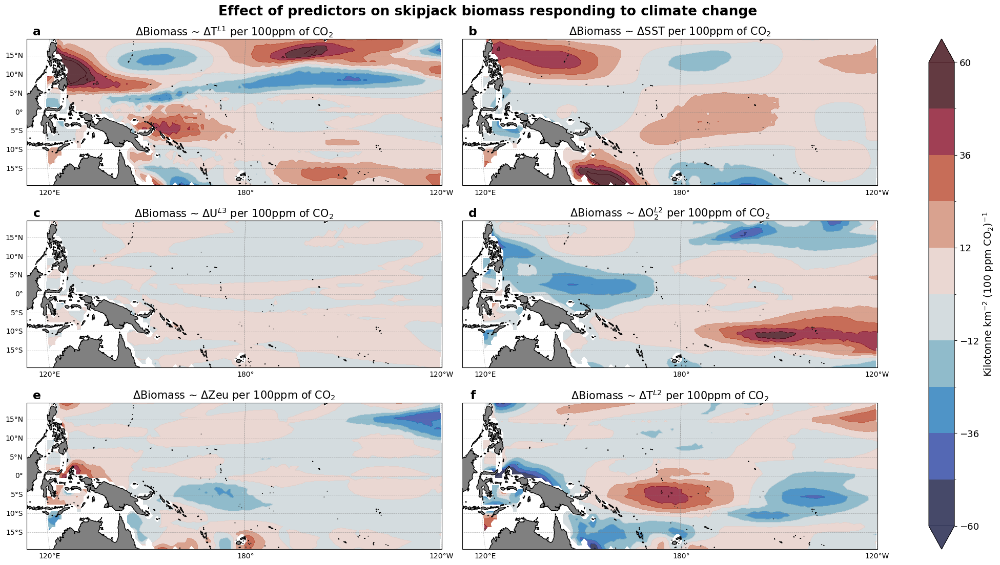

In [30]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)

levs1 = np.arange(-10,11,2)*6.0
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, cc_T_L1_tuna_slope.T * 100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p2 = ax2.contourf(lons, lats, cc_sst_tuna_slope.T * 100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p3 = ax3.contourf(lons, lats, cc_U_L3_tuna_slope.T * 100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p4 = ax4.contourf(lons, lats, cc_O2_L2_tuna_slope.T * 100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p5 = ax5.contourf(lons, lats, cc_zeu_tuna_slope.T * 100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p6 = ax6.contourf(lons, lats, cc_T_L2_tuna_slope.T * 100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$T$^{L1}$ per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$SST per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$U$^{L3}$ per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$O$_2^{L2}$ per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$Zeu per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$T$^{L2}$ per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=0.15, left=0.05, right=0.88, bottom=0.05, top=0.90)

pos2 = ax2.get_position()
pos6 = ax6.get_position()
cbax1 = fig.add_axes([pos6.x1+0.05,pos6.y0,0.025,pos2.y1-pos6.y0])

cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::2])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("Kilotonne km$^{-2}$ (100 ppm CO$_2$)$^{-1}$", fontsize=fslab-1)

plt.text(0.5,0.935, "Effect of predictors on skipjack biomass responding to climate change", fontweight="bold", fontsize=fslab+4, va='center', ha='center', transform=fig.transFigure)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/EffectsOfCO2_Oceanography_IMFs_trends.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/EffectsOfCO2_Oceanography_IMFs_trends_transparent.png", dpi=300, bbox_inches='tight', transparent=True)



### Save all of these correlations and slopes to netcdfs for EEZ cutouts for Thomas

In [31]:
(enso_T_L1_tuna_slope.T * enso_da.std().values)

<xarray.DataArray (lat: 40, lon: 120)> Size: 38kB
array([[         nan,          nan,          nan, ...,   0.28013393,
          0.27225088,   0.16303599],
       [         nan,          nan,          nan, ...,   0.63474133,
          0.27269729,   0.52004186],
       [         nan,          nan,          nan, ...,   0.82995272,
          0.99556664,   0.73602544],
       ...,
       [-16.24221214,          nan,  -9.35730734, ...,   3.91974373,
          2.37508305,   3.53487041],
       [-10.25683154,          nan,  -8.49249294, ...,   2.68526873,
          2.89024335,   3.93800282],
       [ -4.84718789,  -4.61887171,  -3.69071499, ...,   1.56621476,
          1.69091521,   3.5781291 ]], shape=(40, 120))
Coordinates:
  * lon      (lon) float64 960B 120.5 121.5 122.5 123.5 ... 237.5 238.5 239.5
  * lat      (lat) float64 320B -19.5 -18.5 -17.5 -16.5 ... 16.5 17.5 18.5 19.5

In [32]:
%%time

std = enso_da.std().values
ds = xr.Dataset(
    data_vars={
        "ENSO_T_L1_effect":  enso_T_L1_tuna_slope.T  * std,
        "ENSO_SST_effect":   enso_sst_tuna_slope.T   * std,
        "ENSO_U_L3_effect":  enso_U_L3_tuna_slope.T  * std,
        "ENSO_O2_L2_effect": enso_O2_L2_tuna_slope.T * std,
        "ENSO_ZEU_effect":   enso_zeu_tuna_slope.T   * std,
        "ENSO_T_L2_effect":  enso_T_L2_tuna_slope.T  * std,
    }
)
ds.to_netcdf(
    "/g/data/es60/SEAPODYM/pearse_GAMs/effect_ENSO_on_Skipjack_allpredictors.nc"
)

std = ipo_da.std().values
ds = xr.Dataset(
    data_vars={
        "IPO_T_L1_effect":  ipo_T_L1_tuna_slope.T  * std,
        "IPO_SST_effect":   ipo_sst_tuna_slope.T   * std,
        "IPO_U_L3_effect":  ipo_U_L3_tuna_slope.T  * std,
        "IPO_O2_L2_effect": ipo_O2_L2_tuna_slope.T * std,
        "IPO_ZEU_effect":   ipo_zeu_tuna_slope.T   * std,
        "IPO_T_L2_effect":  ipo_T_L2_tuna_slope.T  * std,
    }
)
ds.to_netcdf(
    "/g/data/es60/SEAPODYM/pearse_GAMs/effect_IPO_on_Skipjack_allpredictors.nc"
)

ds = xr.Dataset(
    data_vars={
        "CC_T_L1_effect":  cc_T_L1_tuna_slope.T  * 100,
        "CC_SST_effect":   cc_sst_tuna_slope.T   * 100,
        "CC_U_L3_effect":  cc_U_L3_tuna_slope.T  * 100,
        "CC_O2_L2_effect": cc_O2_L2_tuna_slope.T * 100,
        "CC_ZEU_effect":   cc_zeu_tuna_slope.T   * 100,
        "CC_T_L2_effect":  cc_T_L2_tuna_slope.T  * 100,
    }
)
ds.to_netcdf(
    "/g/data/es60/SEAPODYM/pearse_GAMs/effect_CC_on_Skipjack_allpredictors.nc"
)


CPU times: user 266 ms, sys: 35.9 ms, total: 302 ms
Wall time: 433 ms


### show the actual long-term linear trend of the skipjack tuna biomass anomaly

In [40]:
%%time

df = pd.read_csv("./anomalous_values_GAM_FS5terms_WCPO.csv")
df = df[['lon','lat','season_year','season','adult_biomass','adult_biomassTF_pred_FS5']]

ds = (
    df
    .set_index(['lon', 'lat', 'season_year', 'season'])
    .to_xarray()
)
ds = ds.assign_coords(season_year=np.arange(1960,2024,1))
ds = ds.sel(season_year=slice(1960,2022),lon=slice(120,240))


CPU times: user 18.9 s, sys: 2.96 s, total: 21.9 s
Wall time: 17.6 s


In [41]:
%%time

enso_realtuna_corr = xr.corr(enso_da, ds['adult_biomass'], dim=['season_year', 'season'])
ipo_realtuna_corr = xr.corr(ipo_da, ds['adult_biomass'], dim=['season_year', 'season'])
cc_realtuna_corr = xr.corr(atmco2_da, ds['adult_biomass'], dim=['season_year', 'season'])

enso_realtuna_slope = xr_slope(ds['adult_biomass']*1e3, enso_da, dim=['season_year', 'season'])
ipo_realtuna_slope = xr_slope(ds['adult_biomass']*1e3, ipo_da, dim=['season_year', 'season'])
cc_realtuna_slope = xr_slope(ds['adult_biomass']*1e3, atmco2_da, dim=['season_year', 'season'])


sjt_trend = xr.apply_ufunc(
    linregress_1d,
    ds['adult_biomass'].mean(dim='season')*1e3,
    time_years,
    input_core_dims=[["season_year"], ["season_year"]],
    output_core_dims=[["stat"]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[float],
    dask_gufunc_kwargs={"output_sizes": {"stat": 5}},
)

sjt_trend = sjt_trend.assign_coords(stat=["slope", "intercept", "r", "p", "stderr"])

sjt_trend_slope = sjt_trend.sel(stat="slope")
sjt_trend_pvals = sjt_trend.sel(stat="p")



CPU times: user 1.3 s, sys: 65.6 ms, total: 1.37 s
Wall time: 1.23 s


CPU times: user 15.3 s, sys: 2.02 s, total: 17.3 s
Wall time: 14.6 s


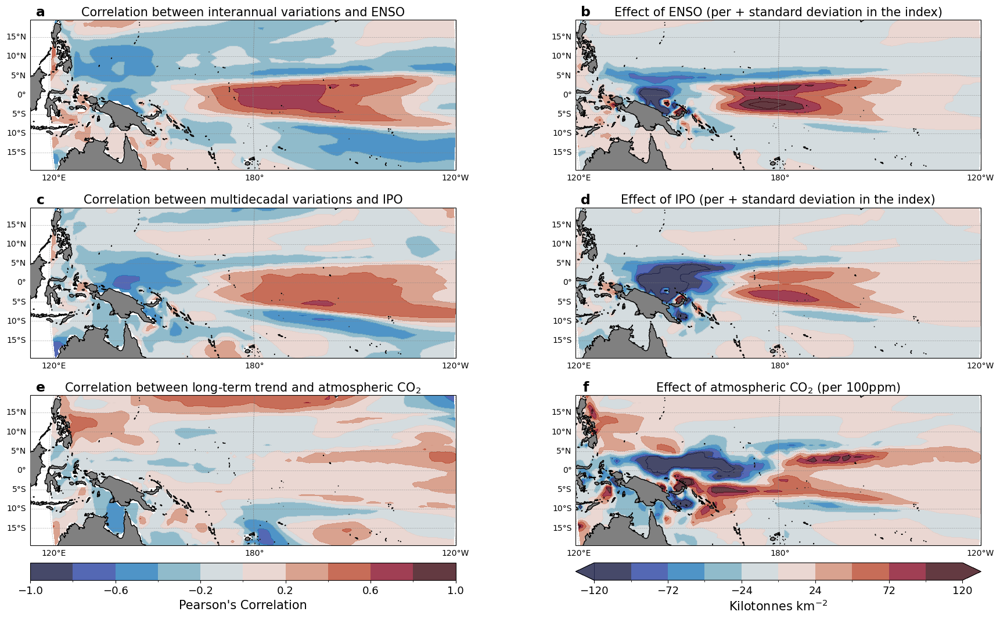

In [42]:
%%time

fstic = 13
fslab = 15

proj = ccrs.Robinson(central_longitude=205)
colmap = lighten(cmo.balance, 0.8)
levs = np.arange(-10,11,2)*0.1
norm = mcolors.BoundaryNorm(levs, ncolors=256)
levs2 = np.arange(-10,11,2)*12
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)

fig = plt.figure(figsize=(20,12))
gs = GridSpec(3,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)

p1 = ax1.contourf(lons, lats, enso_realtuna_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm, levels=levs, extend='neither')
p3 = ax3.contourf(lons, lats, ipo_realtuna_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm, levels=levs, extend='neither')
p5 = ax5.contourf(lons, lats, cc_realtuna_corr.T, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm, levels=levs, extend='neither')

p2 = ax2.contourf(lons, lats, enso_realtuna_slope.T * enso_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p4 = ax4.contourf(lons, lats, ipo_realtuna_slope.T * ipo_da.std().values, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p6 = ax6.contourf(lons, lats, cc_realtuna_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')

#p3 = ax3.contourf(lons, lats, slope_annual.T*10*4, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
#c3 = ax3.contourf(lons, lats, pvals_annual.T, transform=ccrs.PlateCarree(), colors='none', levels=[0.0,0.05,1.0], hatches=[' ', '...'])

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"Correlation between interannual variations and ENSO", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"Correlation between multidecadal variations and IPO", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"Correlation between long-term trend and atmospheric CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"Effect of ENSO (per + standard deviation in the index)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"Effect of IPO (per + standard deviation in the index)", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"Effect of atmospheric CO$_2$ (per 100ppm)", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)
#plt.text(xx,yy,"Long-term trends (1960 - 2022)", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=0.25, left=0.05, right=0.95, bottom=0.125)

pos5 = ax5.get_position()
pos6 = ax6.get_position()

cbax5 = fig.add_axes([pos5.x0,pos5.y0-0.05,pos5.x1-pos5.x0,0.025])
cbax6 = fig.add_axes([pos6.x0,pos6.y0-0.05,pos6.x1-pos6.x0,0.025])

cbar5 = plt.colorbar(p5, cax=cbax5, orientation='horizontal', ticks=levs[::2])
cbar5.ax.tick_params(labelsize=fstic)
cbar5.ax.set_xlabel("Pearson's Correlation", fontsize=fslab)
cbar6 = plt.colorbar(p6, cax=cbax6, orientation='horizontal', ticks=levs2[::2])
cbar6.ax.tick_params(labelsize=fstic)
cbar6.ax.set_xlabel("Kilotonnes km$^{-2}$", fontsize=fslab)


xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)

fig.savefig("./figures/ENSO_IPO_CorrelationsSlopes_RealAdultAnomalies.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/ENSO_IPO_CorrelationsSlopes_RealAdultAnomalies_transparent.png", dpi=300, bbox_inches='tight', transparent=True)




In [43]:
print(xr.corr(sjt_trend_slope, slope_annual)**2)

<xarray.DataArray ()> Size: 8B
array(0.24013284)
Coordinates:
    stat     <U9 36B 'slope'


### Check out the drivers of the long-term trends


CPU times: user 21 s, sys: 2.82 s, total: 23.9 s
Wall time: 20 s


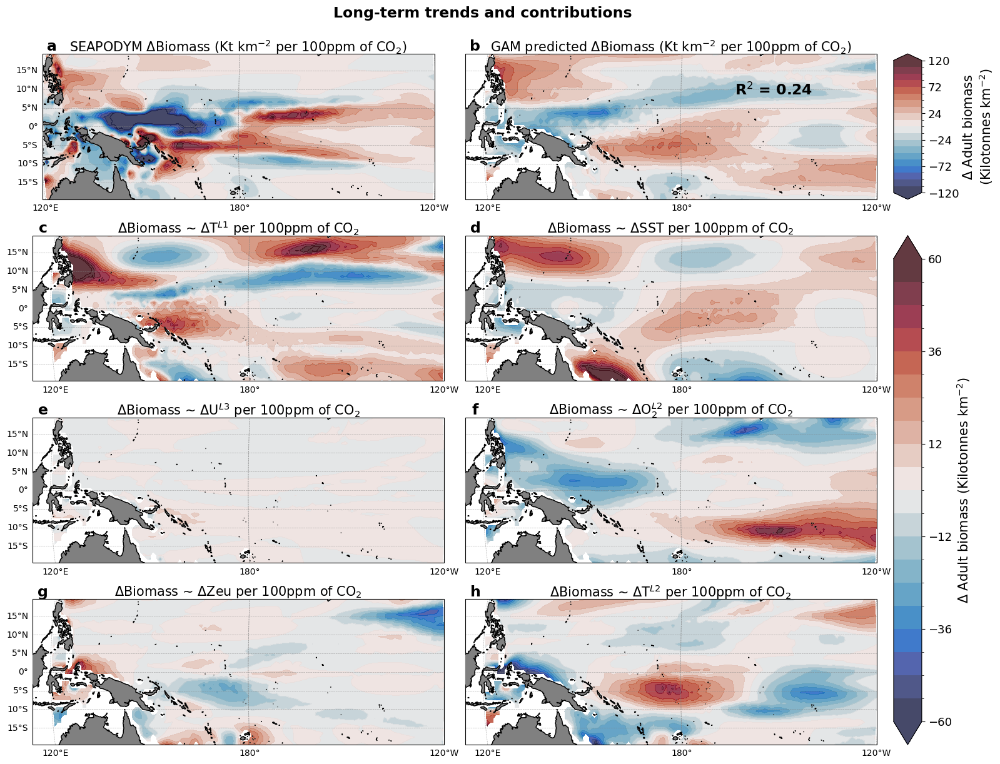

In [44]:
%%time

proj = ccrs.Robinson(central_longitude=205)

fstic = 13
fslab = 15

colmap = lighten(cmo.balance, 0.8)
levs1 = np.arange(-10,11,1)*12
norm1 = mcolors.BoundaryNorm(levs1, ncolors=256)
levs2 = np.arange(-10,11,1)*6
norm2 = mcolors.BoundaryNorm(levs2, ncolors=256)

fig = plt.figure(figsize=(18,13))
gs = GridSpec(4,2)

ax1 = plt.subplot(gs[0,0], projection=proj)
ax2 = plt.subplot(gs[0,1], projection=proj)
ax3 = plt.subplot(gs[1,0], projection=proj)
ax4 = plt.subplot(gs[1,1], projection=proj)
ax5 = plt.subplot(gs[2,0], projection=proj)
ax6 = plt.subplot(gs[2,1], projection=proj)
ax7 = plt.subplot(gs[3,0], projection=proj)
ax8 = plt.subplot(gs[3,1], projection=proj)

p1 = ax1.contourf(lons, lats, cc_realtuna_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p2 = ax2.contourf(lons, lats, cc_tuna_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm1, levels=levs1, extend='both')
p3 = ax3.contourf(lons, lats, cc_T_L1_tuna_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p4 = ax4.contourf(lons, lats, cc_sst_tuna_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p5 = ax5.contourf(lons, lats, cc_U_L3_tuna_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p6 = ax6.contourf(lons, lats, cc_O2_L2_tuna_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p7 = ax7.contourf(lons, lats, cc_zeu_tuna_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')
p8 = ax8.contourf(lons, lats, cc_T_L2_tuna_slope.T*100, transform=ccrs.PlateCarree(), cmap=colmap, norm=norm2, levels=levs2, extend='both')

ax1.add_feature(cfeature.LAND, color='grey', zorder=3)
ax1.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax2.add_feature(cfeature.LAND, color='grey', zorder=3)
ax2.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax3.add_feature(cfeature.LAND, color='grey', zorder=3)
ax3.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax4.add_feature(cfeature.LAND, color='grey', zorder=3)
ax4.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax5.add_feature(cfeature.LAND, color='grey', zorder=3)
ax5.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax6.add_feature(cfeature.LAND, color='grey', zorder=3)
ax6.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax7.add_feature(cfeature.LAND, color='grey', zorder=3)
ax7.add_feature(cfeature.COASTLINE, color='k', zorder=4)
ax8.add_feature(cfeature.LAND, color='grey', zorder=3)
ax8.add_feature(cfeature.COASTLINE, color='k', zorder=4)

gl1 = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl2 = ax2.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl3 = ax3.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl4 = ax4.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl5 = ax5.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl6 = ax6.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl7 = ax7.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')
gl8 = ax8.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.6, linestyle='--')

gl1.top_labels = False; gl1.right_labels = False
gl2.top_labels = False; gl2.right_labels = False; gl2.left_labels = False
gl3.top_labels = False; gl3.right_labels = False
gl4.top_labels = False; gl4.right_labels = False; gl4.left_labels = False
gl5.top_labels = False; gl5.right_labels = False
gl6.top_labels = False; gl6.right_labels = False; gl6.left_labels = False
gl7.top_labels = False; gl7.right_labels = False
gl8.top_labels = False; gl8.right_labels = False; gl8.left_labels = False

xx = 0.5; yy=1.05
plt.text(xx,yy,"SEAPODYM $\Delta$Biomass (Kt km$^{-2}$ per 100ppm of CO$_2$)", fontsize=fslab, ha='center', va='center', transform=ax1.transAxes)
plt.text(xx,yy,"GAM predicted $\Delta$Biomass (Kt km$^{-2}$ per 100ppm of CO$_2$)", fontsize=fslab, ha='center', va='center', transform=ax2.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$T$^{L1}$ per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax3.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$SST per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax4.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$U$^{L3}$ per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax5.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$O$_2^{L2}$ per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax6.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$Zeu per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax7.transAxes)
plt.text(xx,yy,"$\Delta$Biomass ~ $\Delta$T$^{L2}$ per 100ppm of CO$_2$", fontsize=fslab, ha='center', va='center', transform=ax8.transAxes)

plt.subplots_adjust(wspace=0.05, hspace=0.25, left=0.1, right=0.85, bottom=0.05, top=0.9)

pos2 = ax2.get_position()
pos4 = ax4.get_position()
pos6 = ax6.get_position()
pos8 = ax8.get_position()
cbax1 = fig.add_axes([pos2.x1+0.015,pos2.y0,0.025,pos2.y1-pos2.y0])
cbax2 = fig.add_axes([pos8.x1+0.015,pos8.y0,0.025,pos4.y1-pos8.y0])
cbar1 = plt.colorbar(p1, cax=cbax1, orientation='vertical', ticks=levs1[::4])
cbar1.ax.tick_params(labelsize=fstic)
cbar1.ax.set_ylabel("$\Delta$ Adult biomass\n(Kilotonnes km$^{-2}$)", fontsize=fslab)
cbar2 = plt.colorbar(p5, cax=cbax2, orientation='vertical', ticks=levs2[::4])
cbar2.ax.tick_params(labelsize=fstic)
cbar2.ax.set_ylabel("$\Delta$ Adult biomass (Kilotonnes km$^{-2}$)", fontsize=fslab)

xx = 0.025; yy = 1.05
plt.text(xx,yy,"a", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax1.transAxes)
plt.text(xx,yy,"b", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(xx,yy,"c", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax3.transAxes)
plt.text(xx,yy,"d", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax4.transAxes)
plt.text(xx,yy,"e", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax5.transAxes)
plt.text(xx,yy,"f", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax6.transAxes)
plt.text(xx,yy,"g", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax7.transAxes)
plt.text(xx,yy,"h", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax8.transAxes)

plt.text(0.75,0.75,"R$^2$ = 0.24", fontweight="bold", fontsize=fslab+2, va='center', ha='center', transform=ax2.transAxes)
plt.text(0.5,0.95, "Long-term trends and contributions", transform=fig.transFigure, fontweight="bold", fontsize=fslab+2, va='center', ha='center')

fig.savefig("./figures/LongTermTrends_fingerprint_predictor_effects.png", dpi=300, bbox_inches='tight')
fig.savefig("./figures/LongTermTrends_fingerprint_predictor_effects_transparent.png", dpi=300, bbox_inches='tight', transparent=True)

